<h1 align='center'> FEniCS Thermal Transport in TiAl$_2$O$_3$ Cylindrical Geometry </h1>
<center>
Nicholas Goldring <br>
RadiaSoft, LLC <br>
April 2022 <br>

***
## Notes
***


model diagram

<img src="figures/crystal_diagram01.PNG">

<!-- $
hse = T_0 + T_1 \left( e^{-\frac{z + l/2}{0.3l}} + e^{\frac{z - l/2}{0.3l}} \right) e^{-\frac{1}{2} {\left(\frac{x^2 + y^2}{w^2} \right)}^{p_x} }
$ -->

<!-- $x, \hspace{1mm} y, \hspace{1mm} z$ : spatial coordinates [cm] \
$T_0$ : temperature input at time = 0s [$^\circ$C] \
$T_1$ : temperature input at time of incident heat load [$^\circ$C] \
$l$ : crystal length [cm] \
$w^2$ : variance [cm$^2$] \
$p_x$ : x-component of Super Gaussian exponent -->

***
$\textbf{Imports and definitions}$
***

In [1]:
import numpy as np
from scipy.optimize import curve_fit
from scipy.optimize import differential_evolution
from scipy.stats import norm
import time as tm
import copy
import warnings
from IPython.display import Latex

from fenics import*
from mshr import*

%matplotlib inline
import matplotlib.pyplot as plt
import plotly.graph_objects
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))
hfontLarge = {'fontname':'Latin Modern Roman', 'size' : 24, 'weight' : 'bold'}
hfontMed = {'fontname':'Latin Modern Roman', 'size' : 19, 'weight' : 'bold'}

***
$\textbf{Create and mesh geometry}$

In [2]:
# geometry dimensions
leng = 1.0  # cylinder length [cm]
diam = 1.5  # cylinder diameter [cm]

# derived parameters
rad = diam / 2    # radius [cm]
lh = leng / 2     # half-length [cm]
rad2 = rad * rad  # radius squared [cm^2]


# create a cylindrical geometry
# cylinder = Cylinder('coordinate of center of the top circle', 'coordinate of center of the bottom circle', 'radius of the circle at the top', 'radius of the circle at the bottom')
cylinder = Cylinder(Point(0, 0, lh), Point(0, 0, -lh), rad, rad)
geometry = cylinder

# define mesh
mden = 16  # 25 # mesh density
mesh = generate_mesh(geometry, mden)

# save the mesh
File("cylinder.pvd") << mesh
print('rad: %s cm' %(rad))

rad: 0.75 cm
Generating mesh with CGAL 3D mesh generator


In [3]:
# plot mesh
print('Geometry')
print('length: %s cm, radius: %s cm' %(leng, rad))
print('Mesh')
print('mesh density: %s, no. of tetrahedral elements: %s, no. of vertices: %s' %(mden, mesh.num_cells(), mesh.num_vertices()))
mesh

Geometry
length: 1.0 cm, radius: 0.75 cm
Mesh
mesh density: 16, no. of tetrahedral elements: 5748, no. of vertices: 1219


***
$\textbf{Define boundary and initial conditions, sources}$

Temperature dependent coefficient of thermal conductivity

temp_vals (degC):  (20, 40, 60, 80)
thermal_cond_vals_test (W/m/degC) [23.345, 21.049, 18.753, 16.457]


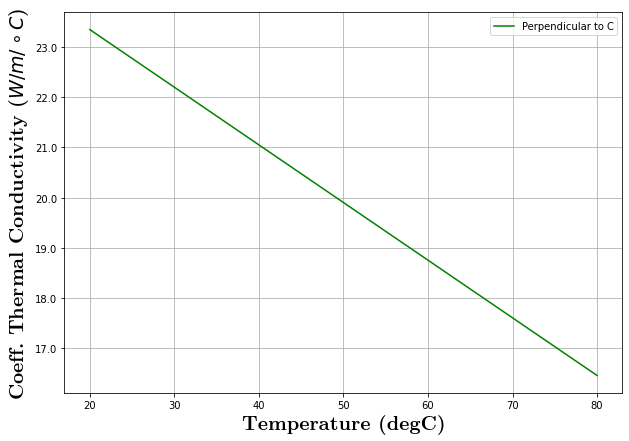

In [4]:
def thermal_cond(x):
    y = -0.1148*x + 25.641
    return y

temp_vals = 20, 40, 60, 80
thermal_cond_vals_test = []

for n in temp_vals:
    tc_val = thermal_cond(n)
    thermal_cond_vals_test.append(tc_val)
    
print('temp_vals (degC): ', temp_vals)
print('thermal_cond_vals_test (W/m/degC)', thermal_cond_vals_test)

fig = plt.figure(figsize=(10,7))
ax = fig.gca()
ax.plot(temp_vals, thermal_cond_vals_test, 'g-', label = 'Perpendicular to C')
# ax.plot(cte_tvals, cte_cvals_par,'b-', label = 'Parallel to C')
ax.set_ylabel(r'Coeff. Thermal Conductivity ($ W/m/ \circ C$)',**hfontMed)
ax.set_xlabel(r'Temperature (degC)',**hfontMed)                         
# ax.set_title(r'Coefficient of Thermal Expansion for $Al_2O_3$',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%1s'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%s'))
#plt.xticks(tvals_10ms)
plt.grid(True)
ax.legend()

In [5]:
# constants
T0    =  0.0   # deg C : T_0
dT    = 20.0   # deg C : T_1
wdT   = 0.375  # cm (1/2 crystal radius)  # 0.075 # cm (1/10 crystal radius)
ldT   =  0.40  # cm
sg_px = 8      # 1 : x-component of super gaussian exponent
sg_py = 1      # 1 : y-component of super gaussian exponent
rad_ratio_sq = (rad**2) / (wdT**2)
log_rrsq = np.log(rad_ratio_sq)
print('log of square of radius ratio: %s' %(log_rrsq))

# define function space on mesh
V = FunctionSpace(mesh, 'P', 1)

# define Dirichlet boundary condition for sides
tol = 1.e-13
def boundary_D(x, on_boundary):
    return on_boundary and near(x[0]*x[0] + x[1]*x[1], rad2, tol)
bc = DirichletBC(V, Constant(T0), boundary_D)

# calculate incremental temperature deposition
P_abs = 35 * 2  # 10.5                                  # absorbed power [W]
V_abs = np.pi * (wdT/100)**2 * (leng/100)   # absorption volume [m^3]  (1/100 to convert cm to m)
rho = 3980                                  # density [kg/m^3]
c_p = 756                                   # specific heat [J/kg/K]

dQ_incr = P_abs / V_abs             # incremental heat deposition [W/m^3]
dT_incr = dQ_incr / rho / c_p       # incremental temperature deposition [K/s]

print('dQ_incr: %f [W/m^3], dT_incr: %f [K/s]' %(dQ_incr, dT_incr))

# define heat load functions
# note: x[0] = x, x[1] = y, x[2] = z
#dQ = 10.579            # heat deposition [W/m^3]

# absorption length inferred from Chenais paper: alpha = ~0.4 1/cm
# absorption length for BELLA pi-polarized pump: 1.2 1/cm  (95.5% absorption)
alpha_h = 1.2           # absorption length [1/cm]

# K = Expression(-0.1148*D.temp + 25.641)
# # Define steady part of the equation
# def operator(u, v):
#     return ( K*inner(grad(u), grad(v)) - f*v + dot(b, grad(u))*v )*dx - K*g*v*dsN

# Gaussian (BELLA pump laser)
pix_to_deg = 6.9                  # pix to micron ratio 1 pixel/6.9 micron
a1 = 3.84e4
b1 = 0.0   # 361.5
c1 = 166.0 * pix_to_deg / 1e4     # variance [cm]
print('variance, c1: %s [cm]' %(c1))

gsn_bella_heat_load = Expression('dT * exp( -(pow(((x[0]*x[0] - b1) / c1), 2) + (pow(((x[1]*x[1] - b1) / c1), 2) ))) * (exp(-alpha_h * x[2]))', degree = 1, dT = dT_incr, b1 = b1, c1 = c1, alpha_h = alpha_h)

# exp(decay) x Super Gaussian
expsg_heat_load = Expression('T0 + dT * (exp(-(x[2]+l/2)/dl) + exp((x[2]-l/2)/dl)) \
                    * exp(-0.5 * pow((x[0]*x[0] + x[1]*x[1])/(w*w), px))',
                 degree=1, T0=T0, dT=dT_incr, w=wdT, l=leng, dl=0.3*leng, px=sg_px)

# uniform top-hat
uniform_heat_load = Expression('dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0)',
                   degree=1, dT=dT_incr, w=wdT)

# z-dependent heat load with abs. length
# long_abs_heat_load = Expression('dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0)*(alpha_h*exp(-alpha_h*x[2]) / (1 - exp(-alpha_h*leng)))',
#                    degree=1, alpha_h=alpha_h, leng=leng, dT=dT_incr, w=wdT)

long_abs_heat_load = Expression('dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0)*(exp(-alpha_h*x[2]))',
                   degree=1, alpha_h=alpha_h, leng=leng, dT=dT_incr, w=wdT)

# chenais top-hat w/ absorption coefficient term and log term
chenais_heat_load_logterm = Expression('dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0) * (exp(-alpha_h*x[2]) / (1 - exp(-alpha_h*leng))) * log_rrsq',
                   degree=1, alpha_h=alpha_h, leng=leng, dT=dT_incr, log_rrsq=log_rrsq, w=wdT)

#test_cpp_func01 = Expression('(alpha_h*exp(alpha_h) / (1 - exp(alpha_h)))', degree=1, alpha_h=alpha_h, dT=dQ, w=wdT)

# T0 + dT x Θ(w–r)
# standard cylinder running length of crystal with given radius
# Heaviside theta function: 1 everywhere argument is positive, 0 everwhere argument is negative
# Vary radius (w^2) - rate of decay.  Try double size of w  
bolus = Expression('T0 + dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0)',
                   degree=1, T0=T0, dT=dT, w=wdT)

# define initial value
# u_n = interpolate(uniform_heat_load, V)
# u_n = interpolate(bolus, V)
# u_n = interpolate(hse, V)
u_n = interpolate(Constant(T0), V)

tol = 1e-2  # originally set to 1e-2 by Dan
u_min = u_n(rad-tol, 0., 0.)
u_max = u_n(0., 0., lh-tol)
#print(u_min, u_max)
u_n(rad-tol, 0., 0.), u_n(0., 0., lh-tol)
#print(u_min, u_max)

log of square of radius ratio: 1.3862943611198906
dQ_incr: 158447587.789265 [W/m^3], dT_incr: 52.659989 [K/s]
variance, c1: 0.11454 [cm]


(0.0, 0.0)

***
Variational formulation \
*A straightforward approach to solving time-dependent PDEs by the finite
element method is to first discretize the time derivative by a finite difference
approximation, which yields a sequence of stationary problems, and then turn
each stationary problem into a variational formulation.*

In [6]:
# define crystal properties
a_Al2O3 = 7.98e-2  # cm^2/s diffusion constant of sapphire (Al2O3) - thermal diffusivity = (thermal conductivity(T) / specific heat capacity(T))
a_perp  = 7.64e-2  # perpendicular to C
a_para  = 8.57e-2  # parallel to C

# define time stepping
T = 1.5e1          # total simulation time [s]
n_steps = 1000     # number of time steps
dt = T / n_steps   # size of time step [s]
nip = 20           # number of intervals between records

# define variational problem
u = TrialFunction(V)
v = TestFunction(V)

# source term 
f = gsn_bella_heat_load           # Gaussian heat load for BELLA pump laser
# f = Constant(0)                 # no source term
# f = uniform_heat_load           # uniform cylindrical heat load
# f = long_abs_heat_load          # Chenais heat load formula (2.1.6) without log term
# f = chenais_heat_load_logterm   # chenais heat load eqn. 2.1.6 with log term
# f = bolus                       # source term bolus
# f = expsg_heat_load             # source term hse

# F = u*v*dx + dt*a_Al2O3*dot(grad(u), grad(v))*dx - (u_n + dt*f)*v*dx + gi*v*ds  # w/ Neumann BC
F = u*v*dx + dt*a_Al2O3*dot(grad(u), grad(v))*dx - (u_n + dt*f)*v*dx  # w/ Dirichlet + initial condition
a, L = lhs(F), rhs(F)

# define time-evolution function
def evolve():

    # report initial state
    yield u_n

    # time-stepping
    u = Function(V)
    t = 0
    for n in range(1, n_steps + 1):

        # update current time
        t += dt

        # compute solution
        set_log_level(30)
        solve(a == L, u, bc)

        # report current state
        if n % nip == 0:
            yield u

        # update previous solution
        u_n.assign(u)

***
$\textbf{Define facets, coordinates for extracting data and plotting}$

In [7]:
# for 3D plots, get the facets, and build an array
# containing the indices of their coordinates
inds = []
for item in dolfin.cpp.mesh.facets(mesh):
    inds.append(item.entities(0).tolist())

# we will provide these indices to plotly so it can draw proper surfaces
inds = np.array(inds)
ii = inds[:, 0]
jj = inds[:, 1]
kk = inds[:, 2]

# get node coördinate values and ranges
xvals = mesh.coordinates()[:,0]
yvals = mesh.coordinates()[:,1]
zvals = mesh.coordinates()[:,2]
xmin, xmax = xvals.min(), xvals.max()
ymin, ymax = yvals.min(), yvals.max()
zmin, zmax = zvals.min(), zvals.max()

***
$\textbf{Execute simulation}$

mesh density: 16, no. of tetrahedral elements: 5748, no. of vertices: 1219
simulation time: 0.527 minutes


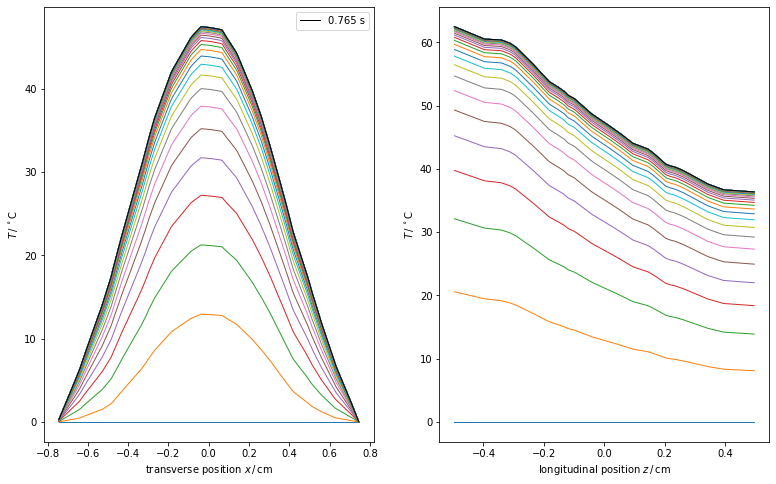

In [8]:
n_rows = 1
n_cols = 2
# fig_wd = 15
# default sizing here yields unit aspect ratio
# plt.figure(figsize = (fig_wd, fig_wd * n_rows // n_cols))
# plt.subplot(n_rows, n_cols, idx)

fig = plt.figure(figsize=(13,8))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

tol = 8.e-3  # avoid points outside domain (for a coarse mesh, increase this value)
xv = np.linspace(xmin * (1 - tol), xmax * (1 - tol), 201)
zv = np.linspace(zmin * (1 - tol), zmax * (1 - tol), 201)
radpts = [(x_, 0, 0) for x_ in xv]
axipts = [(0, 0, z_) for z_ in zv]

idx = 0
t0 = tm.time()
for u in evolve():
    idx += 1
    ux = np.array([u(pt) for pt in radpts])
    uz = np.array([u(pt) for pt in axipts])
    fig1.plot(xv, ux, lw=1)  
    fig2.plot(zv, uz, lw=1)  
t1 = tm.time()

fig1.plot(xv, ux, 'k', lw=1, label='{0:5.3f} s'.format(idx*dt))
fig1.legend()
fig2.plot(zv, uz, 'k', lw=1)  
#fig2.legend()

fig1.set_xlabel(r'transverse position $x\,/\,\mathrm{cm}$')
fig1.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
fig2.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
fig2.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')

fig.savefig('heat_decay_profiles.pdf')
fig.show()

print('mesh density: %s, no. of tetrahedral elements: %s, no. of vertices: %s' %(mden, mesh.num_cells(), mesh.num_vertices()))
print("simulation time: %4.3f minutes" % ((t1 - t0)/60.0))
#print("simulation time: %4.3f seconds" % (t1 - t0))

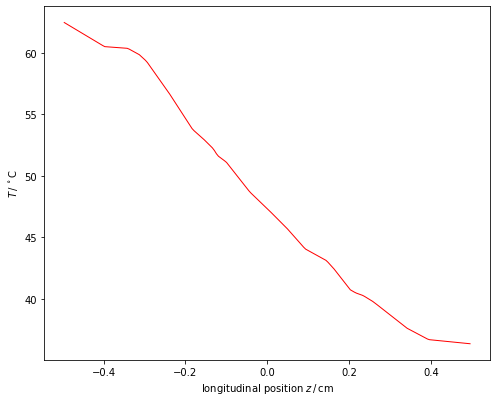

In [9]:
# plot longitudinal temperature profile
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(zv, uz,'r-', lw = 1)
ax.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
ax.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
fig.show()

***
$\textbf{Calculate longitudinal average of transverse temperatures and find quadratic fits for n slices}$

##### 1. Extract longitudinal temp data for range of radii.

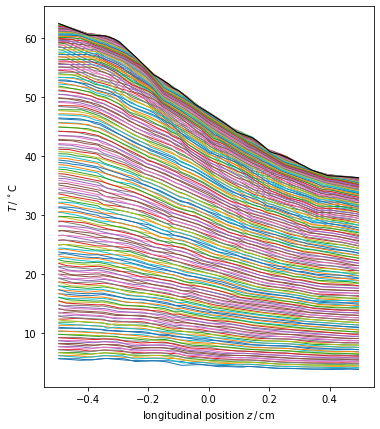

In [10]:
# note:
# throws an error to evaluate at the limits of radpts -
# reduce the value of radpts by some factor, rad_fac
rad_fac = 0.9
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
uz_array = np.zeros((len(radpts), len(zv)))
for j in range(len(radpts)):
    uz_array[j] = [u(pt) for pt in [(radpts[j][0]*rad_fac, 0, z_) for z_ in zv]]
    fig1.plot(zv, uz_array[j], lw=1)
    # fig1.plot(zv, uz_array[j], lw=1, label='{0:5.1f}'.format(radpts[j][0]*.9))
fig1.plot(zv, uz, 'k', lw=1)
fig1.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
fig1.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
# fig1.legend()
fig.show()

##### 2. Divide data into n longitudinal slices.

In [11]:
n_uz = 8                            # no. of longitudinal slices
n_uz_tot = len(radpts) - 1          # total no. of longitudinal profiles in uz_array
print('total no. of longitudinal profiles in uz_array:', n_uz_tot)

# extract only r_x vals from radpts
radpts_array = np.array(radpts)
radpts_x = radpts_array[:,0]
print('shape of radpts_x:', np.shape(radpts_x))

# print(uz_array[:,0:n_uz])
# print('shape of uz_array[0:n_uz,:]:', np.shape(uz_array[0:n_uz,:]))
# print('shape of zv:', np.shape(zv))
# print('shape of zv[0:n_uz]:', np.shape(zv[0:n_uz]))



total no. of longitudinal profiles in uz_array: 200
shape of radpts_x: (201,)


In [12]:
dslice_ind = int(n_uz_tot/n_uz)                 # size of of slice indeces
print('size of slice indeces, dslice_ind:', dslice_ind)

size of slice indeces, dslice_ind: 25


In [13]:
for i in range(0,5):
    globals()['x'+str(i)] = i
    
    # print(x1)
print(x0)
print(x1)

0
1


In [17]:
############################################

for j in range(n_uz - 1):
    
    print(j + 1)
    uz_array0 = np.transpose(uz_array[:,0:dslice_ind])
    zv_array0 = zv[0:dslice_ind]
    radpts_x0 = radpts_array[0:dslice_ind,:]  
    
    globals()['uz_array'+str(j + 1)] = np.transpose(uz_array[:,(dslice_ind*(j+1)):(dslice_ind*(j+2))])
    globals()['zv_array'+str(j + 1)] = zv[(dslice_ind*j):(dslice_ind*(j+1))]
    globals()['radpts_x'+str(j + 1)] = radpts_array[(dslice_ind*j):(dslice_ind*(j+1)),:] 
    
# print(np.shape(uz_array0))
# print(np.shape(uz_array1))
# print(np.shape(uz_array2))
# print(np.shape(uz_array3))
# print(np.shape(zv_array3))

1
2
3
4
5
6
7


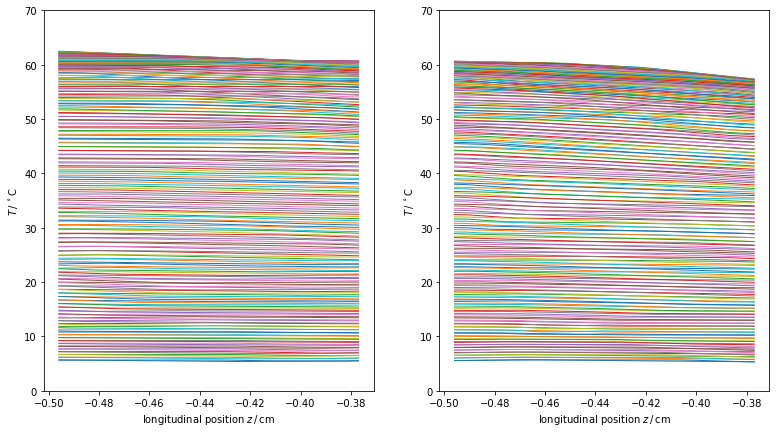

In [15]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(zv_array0, uz_array0, lw=1)
fig1.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
fig1.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
fig1.set_ylim(0, 70)


fig2.plot(zv_array1, uz_array1, lw=1)
fig2.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
fig2.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
fig2.set_ylim(0, 70)
# fig1.legend()

fig.show()

# print(uz_array[0:n_uz,:])
# print('shape of uz_array[0:n_uz,:]:', np.shape(uz_array[0:n_uz,:]))

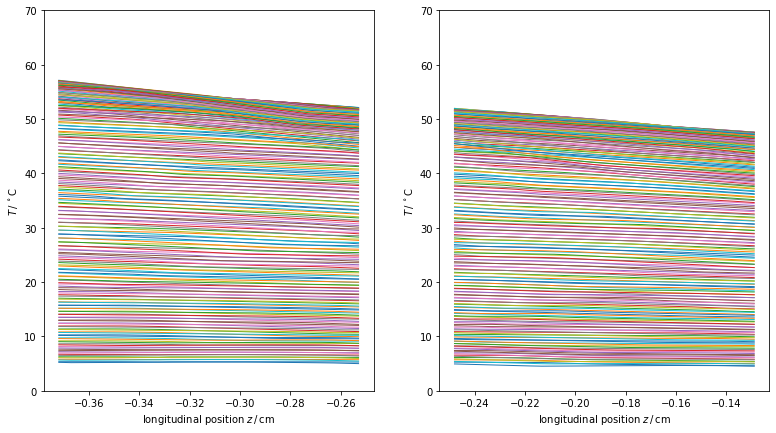

In [16]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(zv_array2, uz_array2, lw=1)
fig1.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
fig1.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
fig1.set_ylim(0, 70)


fig2.plot(zv_array3, uz_array3, lw=1)
fig2.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
fig2.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
fig2.set_ylim(0, 70)
# fig1.legend()

fig.show()

# print(uz_array[0:n_uz,:])
# print('shape of uz_array[0:n_uz,:]:', np.shape(uz_array[0:n_uz,:]))

In [19]:
# calculate longitudinal step size, dz
dz = (zv[len(zv) - 1] - zv[0]) / (len(zv) - 1)
print('dz: %.7s cm' %(dz))

for j in range(n_uz):
    globals()['t_int_vals'+str(j)] = []
    # print(j)
    for i in range((len(radpts_x) - 0)):
    # print('j + 1:', j + 1)
    
        globals()['t_int'+str(j)] = np.sum(globals()['uz_array'+str(j)][:,i]) * dz / (leng / n_uz)
        # print(t_int0)
        # print(t_int1)
        globals()['t_int_vals'+str(j)].append(globals()['t_int'+str(j)])
        # t_int0 = np.sum(uz_array0[:,j]) * dz / (leng / n_uz)  # divide by n_uz because leng is now only 1/n_uz*leng_total
        # t_int_vals0.append(t_int0)
    
#     uz_array0 = np.transpose(uz_array[:,0:dslice_ind])
#     zv_array0 = zv[0:dslice_ind]
#     radpts_x0 = radpts_array[0:dslice_ind,:]  
       
#     globals()['uz_array'+str(j + 1)] = np.transpose(uz_array[:,(dslice_ind*(j+1)):(dslice_ind*(j+2))])
#     globals()['zv_array'+str(j + 1)] = zv[(dslice_ind*j):(dslice_ind*(j+1))]
#     globals()['radpts_x'+str(j + 1)] = radpts_array[(dslice_ind*j):(dslice_ind*(j+1)),:] 

# print(t_int_vals0)
# print(t_int_vals1)
# print(t_int_vals2)
# print(t_int_vals3)

dz: 0.00496 cm


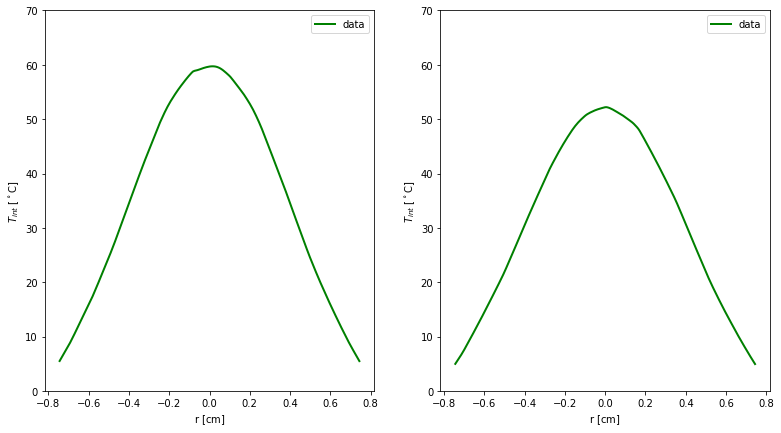

In [32]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(radpts_x, t_int_vals0,'g-', linewidth = 2, label = 'data')
# fig1.plot(radpts_x_laser, fit_yq_int0,'b--', linewidth = 2, label = 'fit')
fig1.set_xlabel(r'r $[\mathrm{cm}]$')
fig1.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig1.set_ylim(0, 70)
fig1.legend()


fig2.plot(radpts_x, t_int_vals1,'g-', linewidth = 2, label = 'data')
# fig2.plot(radpts_x_laser, fit_yq_int1,'b--', linewidth = 2, label = 'fit')
fig2.set_xlabel(r'r $[\mathrm{cm}]$')
fig2.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig2.set_ylim(0, 70)
fig2.legend()

fig.show()

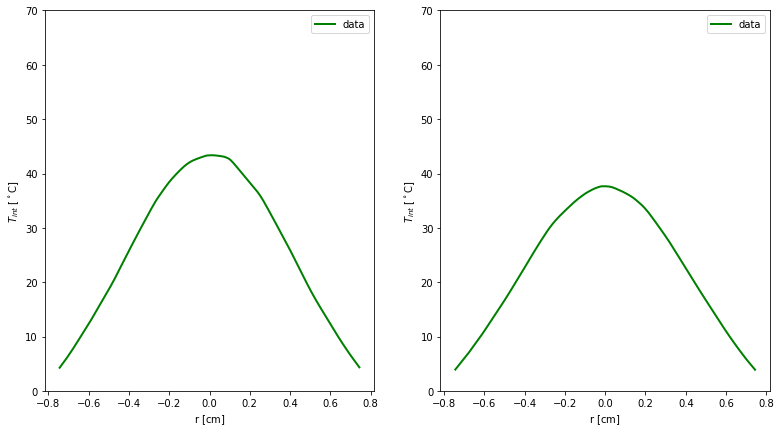

In [33]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(radpts_x, t_int_vals2,'g-', linewidth = 2, label = 'data')
# fig1.plot(radpts_x_laser, fit_yq_int0,'b--', linewidth = 2, label = 'fit')
fig1.set_xlabel(r'r $[\mathrm{cm}]$')
fig1.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig1.set_ylim(0, 70)
fig1.legend()


fig2.plot(radpts_x, t_int_vals3,'g-', linewidth = 2, label = 'data')
# fig2.plot(radpts_x_laser, fit_yq_int1,'b--', linewidth = 2, label = 'fit')
fig2.set_xlabel(r'r $[\mathrm{cm}]$')
fig2.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig2.set_ylim(0, 70)
fig2.legend()

fig.show()

In [20]:
# create arrays for T_int(r) and r for region within laser radius
laser_ran_min = 49 # 49      # min index value of center data range
laser_ran_max = 152 # 152    # max index value of center data range
radpts_x_laser = radpts_x[laser_ran_min:laser_ran_max]

In [21]:
for j in range(n_uz):
    globals()['t_int_vals'+str(j)+str('laser')] = globals()['t_int_vals'+str(j)][laser_ran_min:laser_ran_max]
    # t_int_vals0_laser = t_int_vals0[laser_ran_min:laser_ran_max]

In [22]:
# quad fit function
def quad_int0(x, A, B):
    y = A*x**2 + B
    return y

In [23]:
for j in range(n_uz):
    
    globals()['parameters_q_int'+str(j)], globals()['covariance_q_int'+str(j)] = curve_fit(quad_int0, radpts_x_laser, globals()['t_int_vals'+str(j)+str('laser')])
    
    globals()['fit_Aq_int'+str(j)] = globals()['parameters_q_int'+str(j)][0]
    globals()['fit_Bq_int'+str(j)] = globals()['parameters_q_int'+str(j)][1]
    
    globals()['fit_yq_int'+str(j)] = quad_int0(radpts_x_laser, globals()['fit_Aq_int'+str(j)], globals()['fit_Bq_int'+str(j)])
    
#     parameters_q_int0, covariance_q_int0 = curve_fit(quad_int0, radpts_x_laser, t_int_vals0_laser)

#     fit_Aq_int0 = parameters_q_int0[0]
#     fit_Bq_int0 = parameters_q_int0[1]

#     fit_yq_int0 = quad_int0(radpts_x_laser, fit_Aq_int0, fit_Bq_int0)

$\hspace{13mm}$ $T_{int} = -164.65567 r^2 + 60.56718$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $T_{int} = -160.50823 r^2 + 58.27854$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}

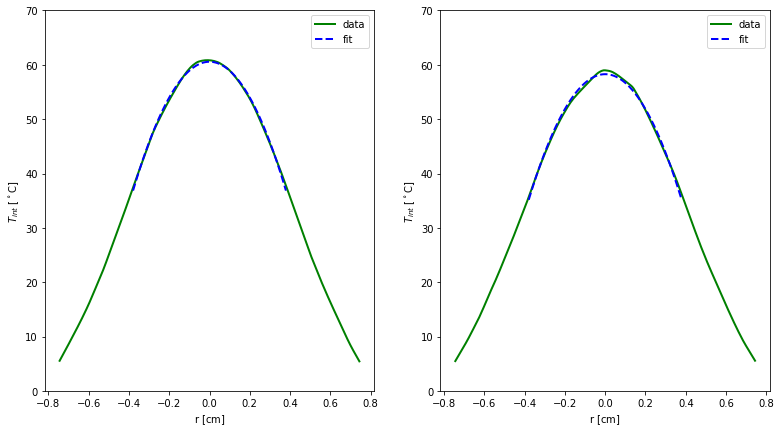

In [24]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(radpts_x, t_int_vals0,'g-', linewidth = 2, label = 'data')
fig1.plot(radpts_x_laser, fit_yq_int0,'b--', linewidth = 2, label = 'fit')
fig1.set_xlabel(r'r $[\mathrm{cm}]$')
fig1.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig1.set_ylim(0, 70)
fig1.legend()


fig2.plot(radpts_x, t_int_vals1,'g-', linewidth = 2, label = 'data')
fig2.plot(radpts_x_laser, fit_yq_int1,'b--', linewidth = 2, label = 'fit')
fig2.set_xlabel(r'r $[\mathrm{cm}]$')
fig2.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig2.set_ylim(0, 70)
fig2.legend()

fig.show()

printmd('$\hspace{13mm}$ $T_{int} = %.5f r^2 + %.5f$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $T_{int} = %.5f r^2 + %.5f$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}' %(fit_Aq_int0, fit_Bq_int0, fit_Aq_int1, fit_Bq_int1))

$\hspace{13mm}$ $T_{int} = -144.02244 r^2 + 53.82884$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $T_{int} = -128.31876 r^2 + 49.20339$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}

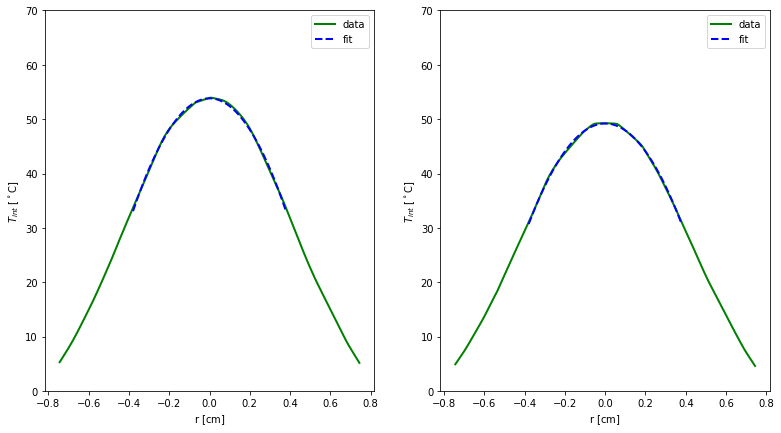

In [25]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(radpts_x, t_int_vals2,'g-', linewidth = 2, label = 'data')
fig1.plot(radpts_x_laser, fit_yq_int2,'b--', linewidth = 2, label = 'fit')
fig1.set_xlabel(r'r $[\mathrm{cm}]$')
fig1.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig1.set_ylim(0, 70)
fig1.legend()


fig2.plot(radpts_x, t_int_vals3,'g-', linewidth = 2, label = 'data')
fig2.plot(radpts_x_laser, fit_yq_int3,'b--', linewidth = 2, label = 'fit')
fig2.set_xlabel(r'r $[\mathrm{cm}]$')
fig2.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig2.set_ylim(0, 70)
fig2.legend()

fig.show()

printmd('$\hspace{13mm}$ $T_{int} = %.5f r^2 + %.5f$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $T_{int} = %.5f r^2 + %.5f$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}' %(fit_Aq_int2, fit_Bq_int2, fit_Aq_int3, fit_Bq_int3))

In [26]:
#calculate n_int vals from t_int_vals
for j in range(n_uz):
    globals()['n_int_vals'+str(j)] = []
    for i in range(len(t_int_vals0)):
        globals()['n_int'+str(j)] = 1.75991 + (1.28e-5 * globals()['t_int_vals'+str(j)][i]) + (3.1e-9 * globals()['t_int_vals'+str(j)][i]**2)
        
        globals()['n_int_vals'+str(j)].append(globals()['n_int'+str(j)])

In [ ]:
# for j in range(n_uz):
    
#     globals()['parameters_q_int'+str(j)], globals()['covariance_q_int'+str(j)] = curve_fit(quad_int0, radpts_x_laser, globals()['t_int_vals'+str(j)+str('laser')])
    
#     globals()['fit_Aq_int'+str(j)] = globals()['parameters_q_int'+str(j)][0]
#     globals()['fit_Bq_int'+str(j)] = globals()['parameters_q_int'+str(j)][1]
    
#     globals()['fit_yq_int'+str(j)] = quad_int0(radpts_x_laser, globals()['fit_Aq_int'+str(j)], globals()['fit_Bq_int'+str(j)])

In [27]:
l_vals = []
n_int_max_vals = []
for j in range(n_uz):
    n_int_max_val = np.max(globals()['n_int_vals'+str(j)])
    n_int_max_vals.append(n_int_max_val)
    l_val = (leng/n_uz)*j + (0.5 * (leng/n_uz))
    l_vals.append(l_val)

In [28]:
print(n_int_max_vals)
print(l_vals)

[1.760700371279394, 1.7606758704086378, 1.760609633584295, 1.7605480847926949, 1.7604938259338225, 1.7604449126817023, 1.7604043167103451, 1.7603793523792686]
[0.0625, 0.1875, 0.3125, 0.4375, 0.5625, 0.6875, 0.8125, 0.9375]


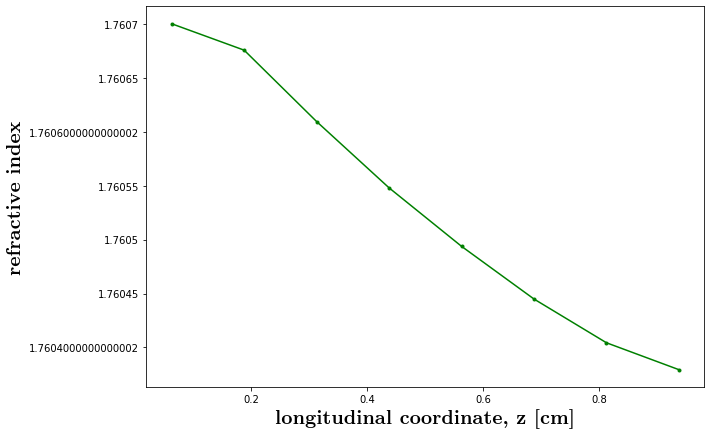

In [29]:
fig = plt.figure(figsize=(10,7))
ax = fig.gca()
ax.plot(l_vals, n_int_max_vals, 'g.-')
# ax.plot(cte_tvals, cte_cvals_par,'b-', label = 'Parallel to C')
ax.set_ylabel(r'refractive index',**hfontMed)
ax.set_xlabel(r'longitudinal coordinate, z [cm]',**hfontMed)                         
# ax.set_title(r'Coefficient of Thermal Expansion for $Al_2O_3$',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%1s'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%s'))
#plt.xticks(tvals_10ms)
# plt.grid(True)
# ax.legend()

In [30]:
# create arrays for n_int(r) for region within laser radius
n_int_vals0_laser = n_int_vals0[laser_ran_min:laser_ran_max]
n_int_vals1_laser = n_int_vals1[laser_ran_min:laser_ran_max]

In [31]:
# # quad fit function
# def quad_int0(x, A, B):
#     y = A*x**2 + B
#     return y

parameters_q_intn0, covariance_q_intn0 = curve_fit(quad_int0, radpts_x_laser, n_int_vals0_laser)
parameters_q_intn1, covariance_q_intn1 = curve_fit(quad_int0, radpts_x_laser, n_int_vals1_laser)
  
fit_Aq_intn0 = parameters_q_intn0[0]
fit_Bq_intn0 = parameters_q_intn0[1]
fit_Aq_intn1 = parameters_q_intn1[0]
fit_Bq_intn1 = parameters_q_intn1[1]
# fit_Cq = parameters_q[2]
  
fit_yq_intn0 = quad_int0(radpts_x_laser, fit_Aq_intn0, fit_Bq_intn0)
fit_yq_intn1 = quad_int0(radpts_x_laser, fit_Aq_intn1, fit_Bq_intn1)

$\hspace{13mm}$ $n_{int} = -0.00216 r^2 + 1.76070$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $n_{int} = -0.00210 r^2 + 1.76067$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}

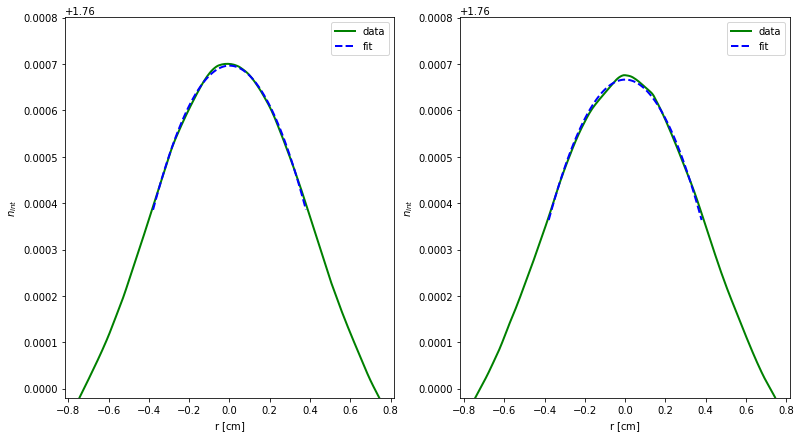

In [32]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(radpts_x, n_int_vals0,'g-', linewidth = 2, label = 'data')
fig1.plot(radpts_x_laser, fit_yq_intn0,'b--', linewidth = 2, label = 'fit')
fig1.set_xlabel(r'r $[\mathrm{cm}]$')
fig1.set_ylabel(r'$n_{int}$')
fig1.set_ylim(np.min(n_int_vals0), np.max(n_int_vals0) + 1e-4)
fig1.legend()


fig2.plot(radpts_x, n_int_vals1,'g-', linewidth = 2, label = 'data')
fig2.plot(radpts_x_laser, fit_yq_intn1,'b--', linewidth = 2, label = 'fit')
fig2.set_xlabel(r'r $[\mathrm{cm}]$')
fig2.set_ylabel(r'$n_{int}$')
fig2.set_ylim(np.min(n_int_vals0), np.max(n_int_vals0) + 1e-4)
# fig2.set_ylim(np.min(n_int_vals1), np.max(n_int_vals1))
fig2.legend()

fig.show()

printmd('$\hspace{13mm}$ $n_{int} = %.5f r^2 + %.5f$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $n_{int} = %.5f r^2 + %.5f$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}' %(fit_Aq_intn0, fit_Bq_intn0, fit_Aq_intn1, fit_Bq_intn1))

#### Earlier code before n-slicing:

***

In [48]:
n_int_vals0 = []
n_int_vals1 = []
n_int_vals2 = []
n_int_vals3 = []

# add 273.15 to t_int_vals to convert from degC to Kelvin

for j in range(len(t_int_vals0)):
    # print('j + 1:', j + 1)
    n_int0 = 1.75991 + (1.28e-5 * t_int_vals0[j]) + (3.1e-9 * t_int_vals0[j]**2)
    n_int_vals0.append(n_int0)
    n_int1 = 1.75991 + (1.28e-5 * t_int_vals1[j]) + (3.1e-9 * t_int_vals1[j]**2)
    n_int_vals1.append(n_int1)
    
    n_int2 = 1.75991 + (1.28e-5 * t_int_vals2[j]) + (3.1e-9 * t_int_vals2[j]**2)
    n_int_vals2.append(n_int2)
    n_int3 = 1.75991 + (1.28e-5 * t_int_vals3[j]) + (3.1e-9 * t_int_vals3[j]**2)
    n_int_vals3.append(n_int3)

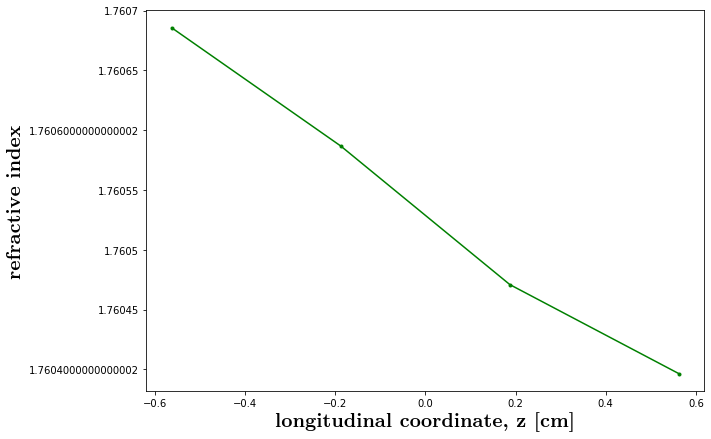

In [52]:
n_int_max_vals = (np.max(n_int_vals0), np.max(n_int_vals1), np.max(n_int_vals2), np.max(n_int_vals3))
l_vals = (-0.5625, -0.1875, 0.1875, 0.5625)

fig = plt.figure(figsize=(10,7))
ax = fig.gca()
ax.plot(l_vals, n_int_max_vals, 'g.-')
# ax.plot(cte_tvals, cte_cvals_par,'b-', label = 'Parallel to C')
ax.set_ylabel(r'refractive index',**hfontMed)
ax.set_xlabel(r'longitudinal coordinate, z [cm]',**hfontMed)                         
# ax.set_title(r'Coefficient of Thermal Expansion for $Al_2O_3$',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%1s'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%s'))
#plt.xticks(tvals_10ms)
# plt.grid(True)
# ax.legend()

First half:

In [16]:
t_int_vals0 = []
# print(range(n_uz))
print(len(radpts_x) - 2)

# calculate longitudinal step size, dz
dz = (zv[len(zv) - 1] - zv[0]) / (len(zv) - 1)
print('dz: %.7s cm' %(dz))

# integrate longitudinal temperatures
# integrate first 1/2 end cap slice 
# t_int_first0 = 0.5 * np.sum(uz_array0[:,0]) * dz / (leng /  n_uz)
# t_int_vals0.append(t_int_first0)
for j in range((len(radpts_x) - 0)):
    # print('j + 1:', j + 1)
    # t_int0_first = np.sum(uz_array0[
    t_int0 = np.sum(uz_array0[:,j]) * dz / (leng / n_uz)  # divide by n_uz because leng is now only 1/n_uz*leng_total
    t_int_vals0.append(t_int0)
# integrate last 1/2 end cap slice
# t_int_last0 = 0.5 * np.sum(uz_array0[:,len(radpts_x) - 1]) * dz / (leng / n_uz)
# t_int_vals0.append(t_int_last0)

    
print('shape of t_int_vals0:', np.shape(t_int_vals0))

199
dz: 0.00496 cm
shape of t_int_vals0: (201,)


In [17]:
# # # extract only r_x vals from radpts
# # radpts_array = np.array(radpts)
# # radpts_x = radpts_array[:,0]

# # calculate longitudinal step size, dz
# dz = (zv[len(zv) - 1] - zv[0]) / (len(zv) - 1)
# print('dz: %.7s cm' %(dz))

# t_int_vals0 = []
# # print(range(n_uz))
# print(len(radpts_x) - 2)
# # integrate longitudinal temperatures
# # integrate first 1/2 end cap slice 
# t_int_first0 = 0.5 * np.sum(uz_array0[:,0]) * dz / (leng /  n_uz)
# t_int_vals0.append(t_int_first0)
# for j in range((len(radpts_x) - 2)):
#     # print('j + 1:', j + 1)
#     t_int0 = np.sum(uz_array0[:,j + 1]) * dz / (leng / n_uz)  # divide by n_uz because leng is now only 1/n_uz*leng_total
#     t_int_vals0.append(t_int0)
# # integrate last 1/2 end cap slice
# t_int_last0 = 0.5 * np.sum(uz_array0[:,len(radpts_x) - 1]) * dz / (leng / n_uz)
# t_int_vals0.append(t_int_last0)

    
# print('shape of t_int_vals0:', np.shape(t_int_vals0))

In [18]:
# print('shape of radpts_x0:', np.shape(radpts_x0))
# print(radpts_x0[:,0])
# print(np.shape(radpts_x0[:,0]))

In [19]:
# create arrays for T_int(r) and r for region within laser radius
laser_ran_min = 49 # 49      # min index value of center data range
laser_ran_max = 152 # 152    # max index value of center data range
radpts_x_laser = radpts_x[laser_ran_min:laser_ran_max]
t_int_vals0_laser = t_int_vals0[laser_ran_min:laser_ran_max]
printmd(r'$r_{min}$: %s, $r_{max}$: %s' %(np.min(radpts_x_laser), np.max(radpts_x_laser)))

$r_{min}$: -0.37944000000000006, $r_{max}$: 0.3794399999999998

In [20]:
# quad fit function
def quad_int0(x, A, B):
    y = A*x**2 + B
    return y

parameters_q_int0, covariance_q_int0 = curve_fit(quad_int0, radpts_x_laser, t_int_vals0_laser)
  
fit_Aq_int0 = parameters_q_int0[0]
fit_Bq_int0 = parameters_q_int0[1]
# fit_Cq = parameters_q[2]
  
fit_yq_int0 = quad_int0(radpts_x_laser, fit_Aq_int0, fit_Bq_int0)

Second half:

In [21]:
# t_int_vals1 = []
# # print(range(n_uz))
# # print(len(radpts_x) - 2)
# # integrate longitudinal temperatures
# # integrate first 1/2 end cap slice 
# # t_int_first1 = 0.5 * np.sum(uz_array1[:,0]) * dz / (leng / n_uz)
# # t_int_vals1.append(t_int_first1)
# # t_int1_first = 0.5 * uz_array[0,0]
# # t_int_vals1.append(t_int1_first)
# print((0.5 * uz_array1[0, j]))
# print((0.5 * uz_array1[len(zv_array1) -1, j]))
# print(np.shape(uz_array1[1:99,0]))
# print(dz / (leng / n_uz))
# # print(len(zv_array1))
# for j in range((len(radpts_x) - 0)):
#     # print('j + 1:', j + 1)
    
#     t_int1 = (0.5 * uz_array1[0, j]) + np.sum(uz_array1[1:99,j] * dz / (leng / n_uz))  + (0.5 * uz_array1[len(zv_array1) -1, j])  # divide by n_uz because leng is now only 1/n_uz*leng_total
#     # t_int1 = (0.5 * uz_array1[0, j]) + np.sum(uz_array1[1:99,j + 0]) * dz / (leng / n_uz)  + (0.5 * uz_array1[len(zv_array1) -1, j])  # divide by n_uz because leng is now only 1/n_uz*leng_total
#     t_int_vals1.append(t_int1)
# # integrate last 1/2 end cap slice
# # t_int_last1 = 0.5 * np.sum(uz_array1[:,len(radpts_x) - 1]) * dz / (leng / n_uz)
# # t_int_vals1.append(t_int_last1)
# # t_int1_last = 0.5 * uz_array[len(radpts_x) - 1,0]
# # t_int_vals1.append(t_int1_last)

    
# print('shape of t_int_vals1:', np.shape(t_int_vals1))

In [22]:
t_int_vals1 = []
# print(range(n_uz))
print(len(radpts_x) - 2)
# integrate longitudinal temperatures
# integrate first 1/2 end cap slice 
# t_int_first1 = 0.5 * np.sum(uz_array1[:,0]) * dz / (leng / n_uz)
# t_int_vals1.append(t_int_first1)
# t_int1_first = 0.5 * uz_array[0,0]
# t_int_vals1.append(t_int1_first)
for j in range((len(radpts_x) - 0)):
    # print('j + 1:', j + 1)
    
    t_int1 = np.sum(uz_array1[:,j + 0]) * dz / (leng / n_uz)  # divide by n_uz because leng is now only 1/n_uz*leng_total
    t_int_vals1.append(t_int1)
# integrate last 1/2 end cap slice
# t_int_last1 = 0.5 * np.sum(uz_array1[:,len(radpts_x) - 1]) * dz / (leng / n_uz)
# t_int_vals1.append(t_int_last1)
# t_int1_last = 0.5 * uz_array[len(radpts_x) - 1,0]
# t_int_vals1.append(t_int1_last)

    
print('shape of t_int_vals1:', np.shape(t_int_vals1))

199
shape of t_int_vals1: (201,)


In [23]:
# # # extract only r_x vals from radpts
# # radpts_array = np.array(radpts)
# # radpts_x = radpts_array[:,0]

# t_int_vals1 = []
# # print(range(n_uz))
# print(len(radpts_x) - 2)
# # integrate longitudinal temperatures
# # integrate first 1/2 end cap slice 
# t_int_first1 = 0.5 * np.sum(uz_array1[:,0]) * dz / (leng / n_uz)
# t_int_vals1.append(t_int_first1)
# for j in range((len(radpts_x) - 2)):
#     # print('j + 1:', j + 1)
#     t_int1 = np.sum(uz_array1[:,j + 1]) * dz / (leng / n_uz)  # divide by n_uz because leng is now only 1/n_uz*leng_total
#     t_int_vals1.append(t_int1)
# # integrate last 1/2 end cap slice
# t_int_last1 = 0.5 * np.sum(uz_array1[:,len(radpts_x) - 1]) * dz / (leng / n_uz)
# t_int_vals1.append(t_int_last1)

    
# print('shape of t_int_vals1:', np.shape(t_int_vals1))

In [24]:
# create array for T_int(r) for region within laser radius
t_int_vals1_laser = t_int_vals1[laser_ran_min:laser_ran_max]

In [25]:
# quad fit function
def quad_int1(x, A, B):
    y = A*x**2 + B
    return y

parameters_q_int1, covariance_q_int1 = curve_fit(quad_int1, radpts_x_laser, t_int_vals1_laser)
  
fit_Aq_int1 = parameters_q_int1[0]
fit_Bq_int1 = parameters_q_int1[1]
# fit_Cq = parameters_q[2]
  
fit_yq_int1 = quad_int1(radpts_x_laser, fit_Aq_int1, fit_Bq_int1)

$\hspace{13mm}$ $T_{int} = -149.01697 r^2 + 55.42713$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $T_{int} = -103.22173 r^2 + 40.09961$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}

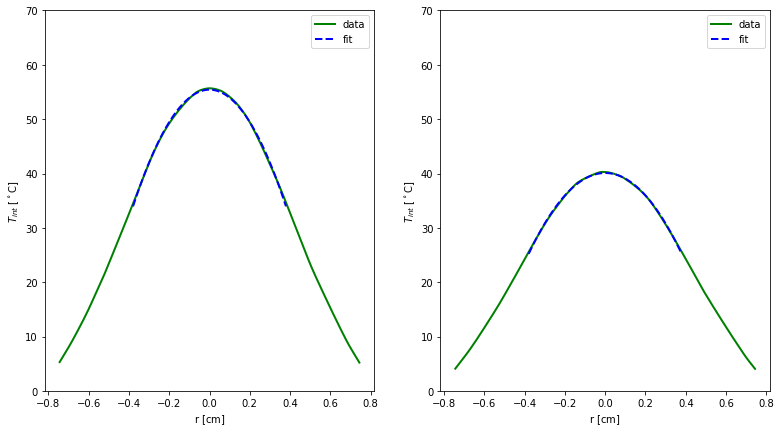

In [26]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(radpts_x, t_int_vals0,'g-', linewidth = 2, label = 'data')
fig1.plot(radpts_x_laser, fit_yq_int0,'b--', linewidth = 2, label = 'fit')
fig1.set_xlabel(r'r $[\mathrm{cm}]$')
fig1.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig1.set_ylim(0, 70)
fig1.legend()


fig2.plot(radpts_x, t_int_vals1,'g-', linewidth = 2, label = 'data')
fig2.plot(radpts_x_laser, fit_yq_int1,'b--', linewidth = 2, label = 'fit')
fig2.set_xlabel(r'r $[\mathrm{cm}]$')
fig2.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
fig2.set_ylim(0, 70)
fig2.legend()

fig.show()

printmd('$\hspace{13mm}$ $T_{int} = %.5f r^2 + %.5f$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $T_{int} = %.5f r^2 + %.5f$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}' %(fit_Aq_int0, fit_Bq_int0, fit_Aq_int1, fit_Bq_int1))

***
Calculate temperature dependent sapphire index of refraction @ 800 nm

$n(T)_{800nm} = 1.75991 + 1.28x10^{-5}T + 3.10x10^{-9}T^2$

[1] Tapping, J., & Reilly, M. L. (1986). Index of refraction of sapphire between 24 and 1060°C for wavelengths of 633 and 799 nm. J. Opt. Soc. Am. A, JOSAA, 3(5), 610–616. doi: 10.1364/JOSAA.3.000610

[2] Cho, S., Jeong, J., Hwang, S., & Yu, T. J. (2018). Thermal lens effect model of Ti:sapphire for use in high-power laser amplifiers. Appl. Phys. Express, 11(9), 092701. doi: 10.7567/apex.11.092701

In [27]:
n_int_vals0 = []
n_int_vals1 = []

# add 273.15 to t_int_vals to convert from degC to Kelvin

for j in range(len(t_int_vals0)):
    # print('j + 1:', j + 1)
    n_int0 = 1.75991 + (1.28e-5 * t_int_vals0[j]) + (3.1e-9 * t_int_vals0[j]**2)
    n_int_vals0.append(n_int0)
    n_int1 = 1.75991 + (1.28e-5 * t_int_vals1[j]) + (3.1e-9 * t_int_vals1[j]**2)
    n_int_vals1.append(n_int1)

In [28]:
# create arrays for n_int(r) for region within laser radius
n_int_vals0_laser = n_int_vals0[laser_ran_min:laser_ran_max]
n_int_vals1_laser = n_int_vals1[laser_ran_min:laser_ran_max]

In [29]:
# # quad fit function
# def quad_int0(x, A, B):
#     y = A*x**2 + B
#     return y

parameters_q_intn0, covariance_q_intn0 = curve_fit(quad_int0, radpts_x_laser, n_int_vals0_laser)
parameters_q_intn1, covariance_q_intn1 = curve_fit(quad_int0, radpts_x_laser, n_int_vals1_laser)
  
fit_Aq_intn0 = parameters_q_intn0[0]
fit_Bq_intn0 = parameters_q_intn0[1]
fit_Aq_intn1 = parameters_q_intn1[0]
fit_Bq_intn1 = parameters_q_intn1[1]
# fit_Cq = parameters_q[2]
  
fit_yq_intn0 = quad_int0(radpts_x_laser, fit_Aq_intn0, fit_Bq_intn0)
fit_yq_intn1 = quad_int0(radpts_x_laser, fit_Aq_intn1, fit_Bq_intn1)

In [30]:
print(np.min(n_int_vals0))
print(np.max(n_int_vals0))

print(np.min(n_int_vals1))
print(np.max(n_int_vals1))

1.7599769880303486
1.7606323177460896
1.7599621650118804
1.7604308817662258


$\hspace{13mm}$ $n_{int} = -0.00195 r^2 + 1.76063$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $n_{int} = -0.00134 r^2 + 1.76043$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}

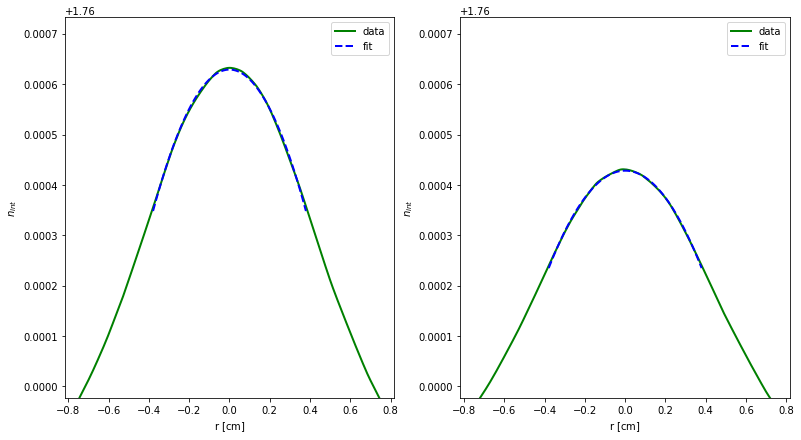

In [31]:
fig = plt.figure(figsize=(13,7))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

fig1.plot(radpts_x, n_int_vals0,'g-', linewidth = 2, label = 'data')
fig1.plot(radpts_x_laser, fit_yq_intn0,'b--', linewidth = 2, label = 'fit')
fig1.set_xlabel(r'r $[\mathrm{cm}]$')
fig1.set_ylabel(r'$n_{int}$')
fig1.set_ylim(np.min(n_int_vals0), np.max(n_int_vals0) + 1e-4)
fig1.legend()


fig2.plot(radpts_x, n_int_vals1,'g-', linewidth = 2, label = 'data')
fig2.plot(radpts_x_laser, fit_yq_intn1,'b--', linewidth = 2, label = 'fit')
fig2.set_xlabel(r'r $[\mathrm{cm}]$')
fig2.set_ylabel(r'$n_{int}$')
fig2.set_ylim(np.min(n_int_vals0), np.max(n_int_vals0) + 1e-4)
# fig2.set_ylim(np.min(n_int_vals1), np.max(n_int_vals1))
fig2.legend()

fig.show()

printmd('$\hspace{13mm}$ $n_{int} = %.5f r^2 + %.5f$ $\hspace{10mm}$ z {-0.5 cm, 0.0 cm} $\hspace{9mm}$ $n_{int} = %.5f r^2 + %.5f$  $\hspace{10mm}$ z {0.0 cm, 0.5 cm}' %(fit_Aq_intn0, fit_Bq_intn0, fit_Aq_intn1, fit_Bq_intn1))

In [204]:
print(range(len(radpts_x0) - 4))

range(0, 96)


shape of t_int_vals0: (198,)


##### 3. Calculate longitudinal temperature integrals for each specified radius and fit T_int(r) curve.

$
T_{int}(r) = \frac{1}{l}\int T dz
$

note: divide dz_min and dz_max by 2 in numerical integral.

In [ ]:
n_uz = 3                      # no. of longitudinal slices
n_uz_tot = len(radpts)        # total no. of longitudinal profiles in uz_array
print('total no. of longitudinal profiles in uz_array:', len(radpts))

In [125]:
# extract only r_x vals from radpts
radpts_array = np.array(radpts)
radpts_x = radpts_array[:,0]

# calculate longitudinal step size, dz
dz = (zv[len(zv) - 1] - zv[0]) / (len(zv) - 1)
print('dz: %.7s cm' %(dz))

t_int_vals = []
# print(range(n_uz))
print(len(radpts_x) - 2)
# integrate longitudinal temperatures
# integrate first 1/2 end cap slice 
t_int_first = 0.5 * np.sum(uz_array[0,:]) * dz / leng
t_int_vals.append(t_int_first)
for j in range(len(radpts_x) - 2):
    # print('j + 1:', j + 1)
    t_int = np.sum(uz_array[j + 1,:]) * dz / leng
    t_int_vals.append(t_int)
# integrate last 1/2 end cap slice
t_int_last = 0.5 * np.sum(uz_array[len(radpts_x) - 1,:]) * dz / leng
t_int_vals.append(t_int_last)

    
print('shape of t_int_vals:', np.shape(t_int_vals))


dz: 0.00496 cm
range(0, 200)
199
shape of t_int_vals: (201,)


In [75]:
# # extract only r_x vals from radpts
# radpts_array = np.array(radpts)
# radpts_x = radpts_array[:,0]

# # calculate longitudinal step size, dz
# dz = (zv[len(zv) - 1] - zv[0]) / (len(zv) - 1)
# print('dz: %.7s cm' %(dz))

# t_int_vals = {}
# print(range(n_uz))
# # integrate longitudinal temperatures
# for i in range(n_uz):
#     uz_ran = np.round(n_uz_tot / (i + 1))
#     print('uz_ran:', uz_ran)
#     # v.sm_fn='tempData/Fluxkt_res_int_me_'+str(n)+'_'+str(div)+'.dat'
#     t_int_vals[i] = i + 1
#     # d = {}
#     # d["t_int_vals{0}".format(uz_ran)] = [] 
#     # d['t_int_vals_' + str(uz_ran)] = []
#     print('shape of t_int_vals:', np.shape(t_int_vals))
#     # for j in range(len(radpts_x)):
#     #     t_int = np.sum(uz_array[j,:]) * dz / leng
#     #     t_int_vals.append(t_int)


dz: 0.00496 cm
range(0, 3)
uz_ran: 201.0
shape of t_int_vals: ()
uz_ran: 100.0
shape of t_int_vals: ()
uz_ran: 67.0
shape of t_int_vals: ()


In [122]:
# print(np.shape(radpts))
# print(radpts)
print('radpts type', type(radpts))
print('radpts_array type:', type(radpts_array))
# print(radpts[0:201][0])
# print(radpts_array[:,0])
print(radpts_x[1] - radpts_x[0])

radpts type <class 'list'>
radpts_array type: <class 'numpy.ndarray'>
0.007440000000000002


In [123]:
# quad fit function
def quad_int(x, A, B):
    y = A*x**2 + B
    return y

parameters_q_int, covariance_q_int = curve_fit(quad_int, radpts_x, t_int_vals)
  
fit_Aq_int = parameters_q_int[0]
fit_Bq_int = parameters_q_int[1]
# fit_Cq = parameters_q[2]
  
fit_yq_int = quad_int(radpts_x, fit_Aq_int, fit_Bq_int)

<IPython.core.display.Latex object>

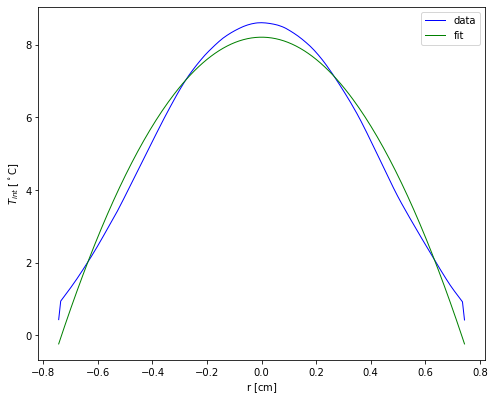

In [124]:
# plot integrated longitudinal temperatures vs radius
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(radpts_x, t_int_vals,'b-', linewidth = 1, label = 'data')
ax.plot(radpts_x, fit_yq_int,'g-', linewidth = 1, label = 'fit')
ax.set_xlabel(r'r $[\mathrm{cm}]$')
ax.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
#plt.grid(True)
ax.legend()
fig.show()


Latex('$T_{int} = %.2f r^2 + %.2f$' %(fit_Aq_int, fit_Bq_int))
# Latex('$r^2 = %.4f$' %covariance_q_int[0])

Fit T_int(r) curve for region within the laser radius.

In [21]:
# create arrays for T_int(r) and r for region within laser radius
laser_ran_min = 49 # 49      # min index value of center data range
laser_ran_max = 152 # 152    # max index value of center data range
radpts_x_laser = radpts_x[laser_ran_min:laser_ran_max]
t_int_vals_laser = t_int_vals[laser_ran_min:laser_ran_max]
Latex(r'$r_{min}$: %s, $r_{max}$: %s' %(np.min(radpts_x_laser), np.max(radpts_x_laser)))

<IPython.core.display.Latex object>

In [22]:
# quad fit function
def quad_int2(x, A, B):
    y = A*x**2 + B
    return y

parameters_q_int2, covariance_q_int2 = curve_fit(quad_int2, radpts_x_laser, t_int_vals_laser)
  
fit_Aq_int2 = parameters_q_int2[0]
fit_Bq_int2 = parameters_q_int2[1]
# fit_Cq = parameters_q[2]
  
fit_yq_int2 = quad_int2(radpts_x_laser, fit_Aq_int2, fit_Bq_int2)

parameters for entire crystal fit: [-15.44362873   8.2314062 ]
parameters for laser diameter fit: [-21.16199917   8.66237209]


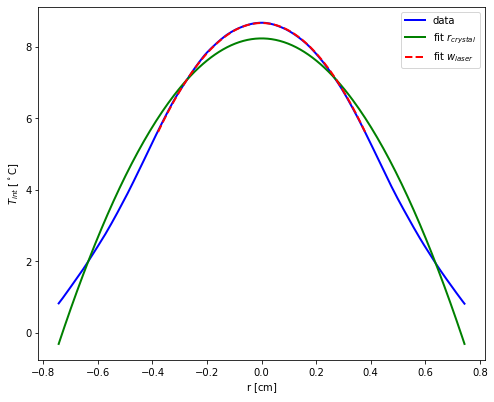

In [23]:
# plot integrated longitudinal temperatures vs radius
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(radpts_x, t_int_vals,'b-', linewidth = 2, label = 'data')
ax.plot(radpts_x, fit_yq_int,'g-', linewidth = 2, label = 'fit $r_{crystal}$')
ax.plot(radpts_x_laser, fit_yq_int2,'r--', linewidth = 2, label = 'fit $w_{laser}$')
ax.set_xlabel(r'r $[\mathrm{cm}]$')
ax.set_ylabel(r'$T_{int}$ $[{}^\circ\mathrm{C}]$')
#plt.grid(True)
ax.legend()
fig.show()

# print('Fit equation over entire crystal diameter:')
Latex('Fit equation over laser diameter: $\ T_{int} = %.2f r^2 + %.2f$' %(fit_Aq_int, fit_Bq_int))

# print('Fit equation over laser diameter:')
Latex('Fit equation over laser diameter: $\ T_{int} = %.2f r^2 + %.2f$' %(fit_Aq_int2, fit_Bq_int2))
# Latex('$r^2 = %.4f$' %covariance_q_int[0])
print('parameters for entire crystal fit:', parameters_q_int)
print('parameters for laser diameter fit:', parameters_q_int2)

In [114]:
# calculate longitudinal step size, dz
dz = (zv[len(zv) - 1] - zv[0]) / (len(zv) - 1)
print('dz: %.7s cm' %(dz))



rad_vals = (radpts[rad_ind_val_1][0], radpts[rad_ind_val_2][0], radpts[rad_ind_val_3][0], radpts[rad_ind_val_4][0], radpts[rad_ind_val_5][0])


t_int1 = np.sum(uz_array[rad_ind_val_1,:])*dz / leng
t_int2 = np.sum(uz_array[rad_ind_val_2,:])*dz / leng
t_int3 = np.sum(uz_array[rad_ind_val_3,:])*dz / leng
t_int4 = np.sum(uz_array[rad_ind_val_4,:])*dz / leng
t_int5 = np.sum(uz_array[rad_ind_val_5,:])*dz / leng

t_int_vals = (t_int1, t_int2, t_int3, t_int4, t_int5)
print('rad_vals', rad_vals)
print('t_int_vals', t_int_vals)

print('crystal length: %s cm' %leng)

dz: 0.00496 cm
rad_vals (0.0, -0.5952, 0.5952, -0.29760000000000003, 0.29759999999999986)
t_int_vals (10.616595071627815, 3.09830483900898, 3.2142357754123108, 8.210002264650775, 8.326031929432096)
crystal length: 1.0 cm


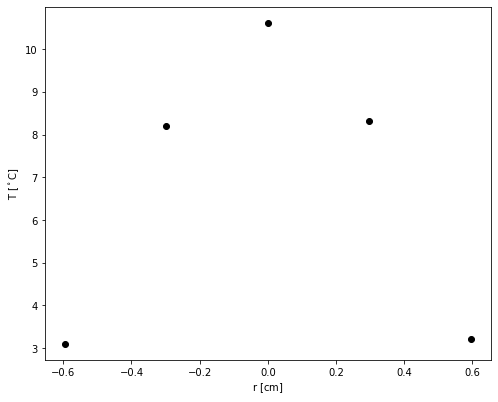

In [120]:
# plot integrated longtiduainl temperatures at specified radii
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(rad_vals, t_int_vals,'ko', linewidth = 1)
# print(uz_array[0,:])
# print(radpts[0])
# ax.plot(lwvals_negx, lwvals_y,'k--', linewidth = 1)
# ax.plot(lwvals_posx, lwvals_y,'k--', linewidth = 1)
# ax.set_xlim(-np.max(xv/rad), np.max(xv/rad))
# ax.set_ylim(0, np.max(ux/np.max(ux)))
ax.set_xlabel(r'r $[\mathrm{cm}]$')
ax.set_ylabel(r'T $[{}^\circ\mathrm{C}]$')
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
# ax.legend()
fig.show()

In [60]:
print(zv[1] - zv[0])
print(zv[2] - zv[1])
print(zv[3] - zv[2])
print((zv[len(zv) - 1] - zv[0]) / (len(zv) - 1))

0.00496000000000002
0.0049599999999999644
0.00496000000000002
0.004960000000000001


***

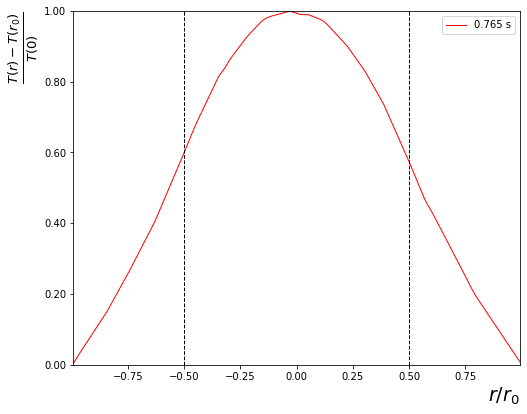

In [45]:
# create data for heat load width dotted lines overlay
lwvals_negx = -wdT/rad, -wdT/rad
lwvals_posx = wdT/rad, wdT/rad
lwvals_y = 0, np.max(ux/np.max(ux))

# plot transverse temperature profile at final time step
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv/rad, ux/np.max(ux),'r-', label='{0:5.3f} s'.format(idx*dt), linewidth = 1)
ax.plot(lwvals_negx, lwvals_y,'k--', linewidth = 1)
ax.plot(lwvals_posx, lwvals_y,'k--', linewidth = 1)
ax.set_xlim(-np.max(xv/rad), np.max(xv/rad))
ax.set_ylim(0, np.max(ux/np.max(ux)))
ax.set_xlabel(r'$r/r_0$', horizontalalignment='right', x=1.0, **hfontMed)
ax.set_ylabel(r'$\frac{T(r) - T(r_0)}{T(0)}$', horizontalalignment='right', y=1.0, **hfontMed)
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
ax.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()

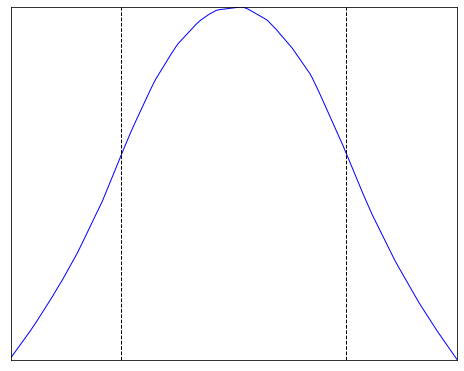

In [10]:
# plot transverse temperature profile at final time step w/o labels
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
# ax.plot(xv/rad, ux/np.max(ux),'g-', label='{0:5.3f} s'.format(idx*dt), linewidth = 1)
ax.plot(xv/rad, ux/np.max(ux),'b-', linewidth = 1)
ax.plot(lwvals_negx, lwvals_y,'k--', linewidth = 1)
ax.plot(lwvals_posx, lwvals_y,'k--', linewidth = 1)
ax.set_xlim(-np.max(xv/rad), np.max(xv/rad))
ax.set_ylim(0, np.max(ux/np.max(ux)))
#ax.set_xlabel(r'$r/r_0$', horizontalalignment='right', x=1.0, **hfontMed)
#ax.set_ylabel(r'$\frac{T(r) - T(r_0)}{T(0)}$', horizontalalignment='right', y=1.0, **hfontMed)
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
#plt.xticks(1)
#plt.grid(True)
#ax.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()

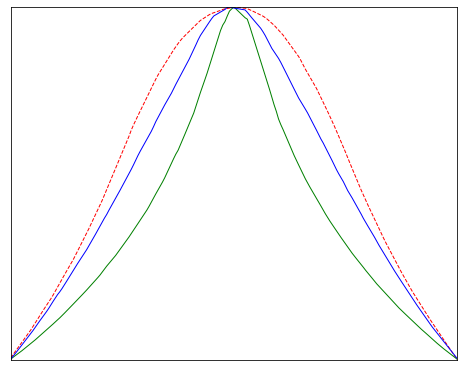

In [11]:
ux4_vals = np.loadtxt('alpha4_vals.txt') 
ux10_vals = np.loadtxt('alpha10_vals.txt')

# plot transverse temperature profile at final time step w/o labels
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
# ax.plot(xv/rad, ux/np.max(ux),'g-', label='{0:5.3f} s'.format(idx*dt), linewidth = 1)
ax.plot(xv/rad, ux/np.max(ux),'r--', linewidth = 1)
ax.plot(xv/rad, ux4_vals,'g-', linewidth = 1)
ax.plot(xv/rad, ux10_vals,'b-', linewidth = 1)
# ax.plot(lwvals_negx, lwvals_y,'k--', linewidth = 1)
# ax.plot(lwvals_posx, lwvals_y,'k--', linewidth = 1)
ax.set_xlim(-np.max(xv/rad), np.max(xv/rad))
ax.set_ylim(0, np.max(ux/np.max(ux)))
#ax.set_xlabel(r'$r/r_0$', horizontalalignment='right', x=1.0, **hfontMed)
#ax.set_ylabel(r'$\frac{T(r) - T(r_0)}{T(0)}$', horizontalalignment='right', y=1.0, **hfontMed)
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
#plt.xticks(1)
#plt.grid(True)
#ax.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()

$\textbf{Chenais Figure 5}$

<img src="figures/chenais_figfive01.png">

***
$\textbf{Curve fitting}$

Chenais Eqn. (2.1.4)

$
T(r) = T(r_0) + \frac{\eta_h P_{abs}}{4 \pi r_{0}^{2} L K_c} (r_{0}^{2} - r^2 )
$


***
Quadratic fit over crystal diameter

In [12]:
# quad fit function
def quad(x, A, B):
    y = A*x**2 + B
    return y

parameters_q, covariance_q = curve_fit(quad, xv, ux)
  
fit_Aq = parameters_q[0]
fit_Bq = parameters_q[1]
# fit_Cq = parameters_q[2]
  
fit_yq = quad(xv, fit_Aq, fit_Bq)

fit parameters:
A: -16.0529, B: 7.5835
covariance: [[ 0.05585651 -0.01040926]
 [-0.01040926  0.0034916 ]]


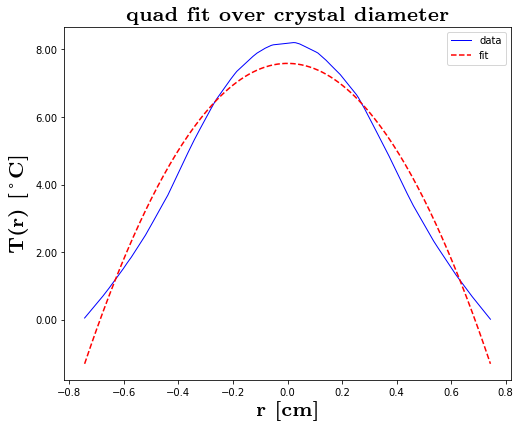

In [13]:
# plot transverse temperature profile with quad fit
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv, ux,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(xv, fit_yq, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)
ax.set_title(r'quad fit over crystal diameter',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
print('fit parameters:')
print('A: %.4f, B: %.4f' %(parameters_q[0], parameters_q[1]))
print('covariance: %s' %(covariance_q))

***
Quadratic fit over beam diameter

In [17]:
cen_ran_min = 49 #90      # min index value of center data range
cen_ran_max = 152 #110    # max index value of center data range
xv_cen = xv[cen_ran_min:cen_ran_max]
ux_cen = ux[cen_ran_min:cen_ran_max]
print(r'xmin: %s, xmax: %s' %(np.min(xv_cen), np.max(xv_cen)))

xmin: -0.37944, xmax: 0.37944


In [19]:
parameters_q_cen, covariance_q_cen = curve_fit(quad, xv_cen, ux_cen)
  
fit_Aq_cen = parameters_q_cen[0]
fit_Bq_cen = parameters_q_cen[1]
# fit_Cq_cen = parameters_q_cen[2]
  
fit_yq_cen = quad(xv_cen, fit_Aq_cen, fit_Bq_cen)

fit parameters:
A: -24.3974, B: 8.1796
covariance: [[ 1.73466829e-03 -8.48817996e-05]
 [-8.48817996e-05  7.47533451e-06]]


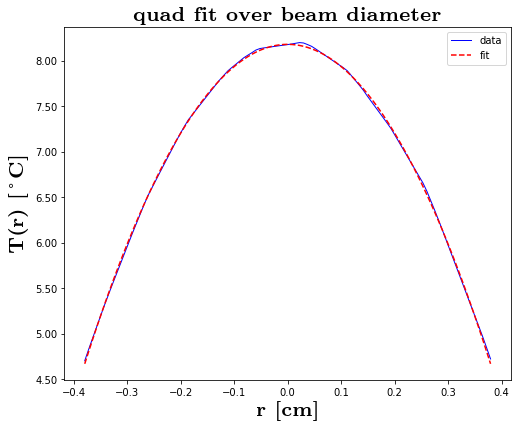

In [22]:
# plot transverse temperature profile with quad fit
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv_cen, ux_cen,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(xv_cen, fit_yq_cen, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)
ax.set_title(r'quad fit over beam diameter',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
print('fit parameters:')
print('A: %.4f, B: %.4f' %(parameters_q_cen[0], parameters_q_cen[1]))
print('covariance: %s' %(covariance_q_cen))

In [23]:
def fit_yq_cen_func(x):
    y = parameters_q_cen[0]*x**2 + parameters_q_cen[1]
    return y

fit_yq_cen_full = []

for n in xv:
    fit_val = fit_yq_cen_func(n)
    fit_yq_cen_full.append(fit_val)

fit parameters:
A: -24.3974, B: 8.1796
covariance: [[ 1.73466829e-03 -8.48817996e-05]
 [-8.48817996e-05  7.47533451e-06]]


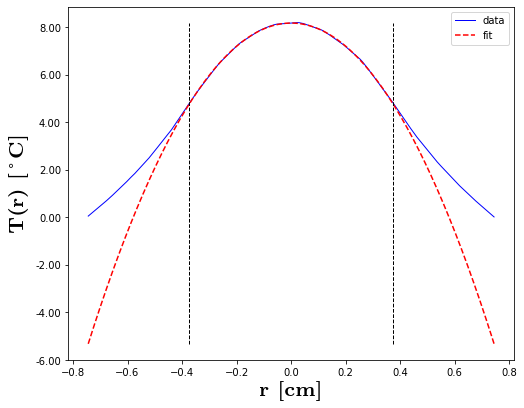

In [29]:
# create data for heat load width dotted lines overlay
wvals_negx = -wdT, -wdT
wvals_posx = wdT, wdT
wvals_y = np.min(fit_yq_cen_full), np.max(fit_yq_cen_full)

# plot transverse temperature profile with quad fit
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv, ux,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(xv, fit_yq_cen_full, 'r--', label='fit')
ax.plot(wvals_negx, wvals_y,'k--', linewidth = 1)
ax.plot(wvals_posx, wvals_y,'k--', linewidth = 1)
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)
# ax.set_title(r'quad fit over beam diameter',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
print('fit parameters:')
print('A: %.4f, B: %.4f' %(parameters_q_cen[0], parameters_q_cen[1]))
print('covariance: %s' %(covariance_q_cen))

***
4th order fit over crystal diameter

In [30]:
# quad fit function
def four_fit(x, A, B, C):
    y = A*x**4 + B*x**2 + C
    return y

parameters_four, covariance_four = curve_fit(four_fit, xv, ux)
  
fit_A_four = parameters_four[0]
fit_B_four = parameters_four[1]
fit_C_four = parameters_four[2]
  
fit_y_four = four_fit(xv, fit_A_four, fit_B_four, fit_C_four)

fit parameters:
A: 23.1451, B: -27.1432, C: 8.2035
covariance: [[ 4.62838218e-02 -2.21775637e-02  1.23974083e-03]
 [-2.21775637e-02  1.15709147e-02 -7.70000731e-04]
 [ 1.23974083e-03 -7.70000731e-04  9.22301149e-05]]


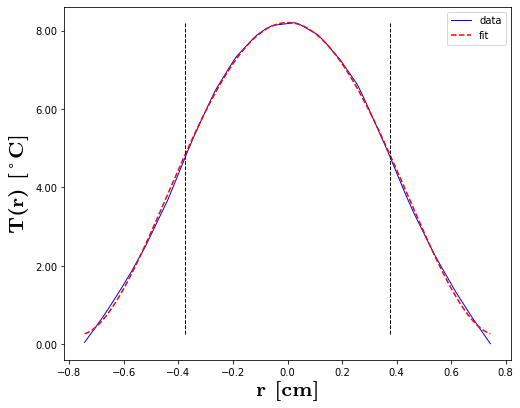

In [34]:
wvals_y_four = np.min(fit_y_four), np.max(fit_y_four)

# plot transverse temperature profile with quad fit
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv, ux,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(xv, fit_y_four, 'r--', label='fit')
ax.plot(wvals_negx, wvals_y_four,'k--', linewidth = 1)
ax.plot(wvals_posx, wvals_y_four,'k--', linewidth = 1)
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)
# ax.set_title(r'quad fit over beam diameter',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
print('fit parameters:')
print('A: %.4f, B: %.4f, C: %.4f' %(parameters_four[0], parameters_four[1], parameters_four[2]))
print('covariance: %s' %(covariance_four))

***
Gaussian fit over crystal diameter

In [12]:
# Gaussian fit function 1
def Gauss(x, A, B):
    y = A*np.exp(-1*B*x**2)
    return y
parameters, covariance = curve_fit(Gauss, xv, ux)

# Gaussian fit function 2
# x0 = rad
# sigma = .2
# def Gauss(x, H, A, x0, sigma):
#     return H + A * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))
# parameters, covariance = curve_fit(Gauss, xv, ux, rad, rad)
  
fit_A = parameters[0]
fit_B = parameters[1]
  
fit_y = Gauss(xv, fit_A, fit_B)

# plt.plot(xv, ux, 'o', label='data')
# plt.plot(xv, fit_y, '-', label='fit')
# plt.legend()

fit parameters:
A: 8.48, B: 4.46


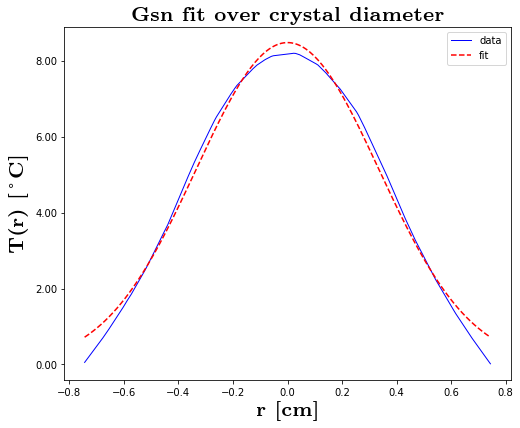

In [72]:
# plot transverse temperature profile with Gsn fit
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv, ux,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(xv, fit_y, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)
ax.set_title(r'Gsn fit over crystal diameter',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
print('fit parameters:')
print('A: %.2f, B: %.2f' %(parameters[0], parameters[1]))

***
Gaussian fit over beam diameter

In [66]:
parameters_cen, covariance_cen = curve_fit(Gauss, xv_cen, ux_cen)


  
fit_A_cen = parameters_cen[0]
fit_B_cen = parameters_cen[1]
  
fit_y_cen = Gauss(xv_cen, fit_A_cen, fit_B_cen)

# plt.plot(xv, ux, 'o', label='data')
# plt.plot(xv, fit_y, '-', label='fit')
# plt.legend()

fit parameters:
A: 8.2548, B: 3.6624
covariance: [[0.00010857 0.00017106]
 [0.00017106 0.00056803]]


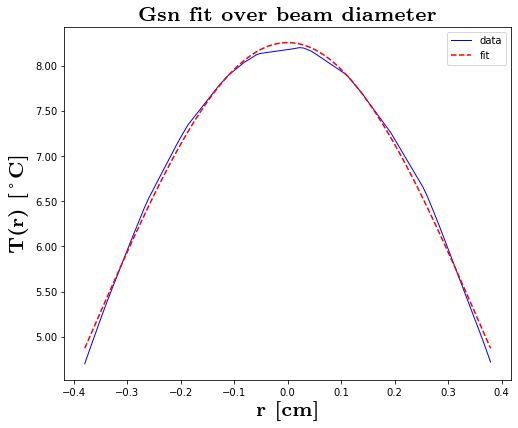

In [75]:
# plot transverse temperature profile with quad fit
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv_cen, ux_cen,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(xv_cen, fit_y_cen, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)
ax.set_title(r'Gsn fit over beam diameter',**hfontMed)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
print('fit parameters:')
print('A: %.4f, B: %.4f' %(parameters_cen[0], parameters_cen[1]))
print('covariance: %s' %(covariance_cen))

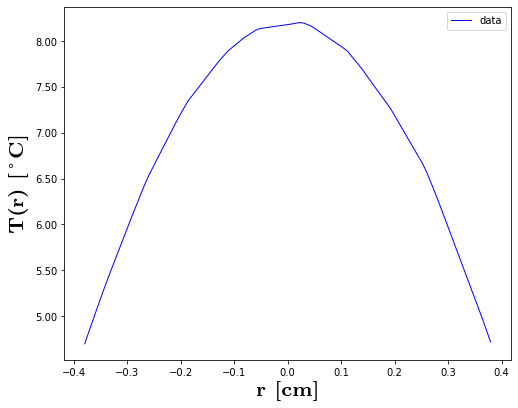

In [59]:
# plot center range of transverse temperature profile
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv_cen, ux_cen,'b-', label='data'.format(idx*dt), linewidth = 1)
#ax.plot(xv, fit_y, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)

#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()

In [41]:
np.savetxt('data/ux01.txt', ux, delimiter=',')
np.savetxt('data/xv01.txt', xv, delimiter=',')
np.savetxt('data/ux_cen01.txt', ux_cen, delimiter=',')
np.savetxt('data/xv_cen01.txt', xv_cen, delimiter=',')

In [21]:
# start_time = time.time()
# print("Total calculation time: %s seconds " % (time.time() - start_time))

therm_const = -25
r0 = rad

# Chenais 2.1.4
def fit_analytic01(r_var):
    # y = -therm_const/r0*(r0**2 - r_var**2)
    y = therm_const * r_var**(2)+6
    return y

In [22]:
fit_an_vals = []

data_len = len(xv_cen)   
nvals = np.linspace(-1, 1, num=data_len)


for n in nvals:
    fit_an = fit_analytic01(n)
    fit_an_vals.append(fit_an)
    # print('n: %s' %n)
    # print('fit_an: %s' %fit_an)

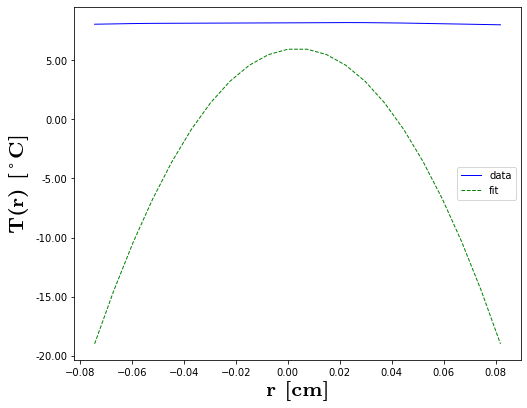

In [23]:
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv_cen, ux_cen,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(xv_cen, fit_an_vals,'g--', label='fit'.format(idx*dt), linewidth = 1)
# ax.plot(xv, fit_y, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)

#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
fig.show()

In [ ]:
def quad(x, a):
    y = a*x**2
    return y
parameters, covariance = curve_fit(Gauss, xv, ux)

# Gaussian fit function 2
# x0 = rad
# sigma = .2
# def Gauss(x, H, A, x0, sigma):
#     return H + A * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))
# parameters, covariance = curve_fit(Gauss, xv, ux, rad, rad)
  
fit_A = parameters[0]
fit_B = parameters[1]
  
fit_y = Gauss(xv, fit_A, fit_B)


/home/vagrant/.pyenv/versions/py3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in exp
  # Remove the CWD from sys.path while we load stuff.


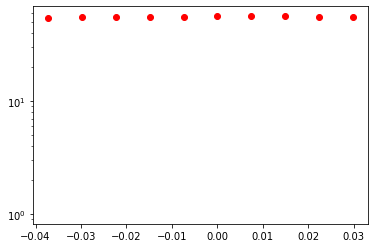

In [23]:
def lq(x, a, b):
    return -(a*x+b*x*x)

# x = np.array([0,1.778,2.921,3.302,6.317,9.524,10.54])
# y = np.array([1,0.831763771,0.598411595,0.656145266,0.207014135,0.016218101,0.004102041])

(a,b), pcov = curve_fit(lq, xv_cen, np.log(ux_cen), p0=[0.05,0.05])

xmodel = np.arange(20)             # Note: use numpy!
ymodel = np.exp(lq(xmodel, a, b))  # Note: take exp() as inverse log()
fig, ax1 = plt.subplots()
ax1.set_yscale('log')
ax1.plot(xv_cen, ux_cen, "ro", label="Experiment")
ax1.plot(xmodel,ymodel, "r--", label="Model")
plt.show()

In [ ]:
# x=[0,1.778,2.921,3.302,6.317,9.524,10.54]
# y=[1,0.831763771,0.598411595,0.656145266,0.207014135,0.016218101,0.004102041]

# zv = np.array(x, dtype=float)
# uz = np.array(y, dtype=float)


def func(x, a, b, c): # Sigmoidal Gompertz C from zunzun.com
    return a * np.exp(b * np.exp(c*x))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = func(zv, *parameterTuple)
    return np.sum((uz - val) ** 2.0)


def generate_Initial_Parameters():
    parameterBounds = []
    parameterBounds.append([-2.0, 2.0]) # search bounds for a
    parameterBounds.append([-2.0, 2.0]) # search bounds for b
    parameterBounds.append([-2.0, 2.0]) # search bounds for c

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=3)
    return result.x

# by default, differential_evolution completes by calling curve_fit() using parameter bounds
geneticParameters = generate_Initial_Parameters()

# now call curve_fit without passing bounds from the genetic algorithm,
# just in case the best fit parameters are aoutside those bounds
fittedParameters, pcov = curve_fit(func, zv, uz, geneticParameters)
print('Fitted parameters:', fittedParameters)
print()

modelPredictions = func(zv, *fittedParameters) 

absError = modelPredictions - uz

SE = np.square(absError) # squared errors
MSE = np.mean(SE) # mean squared errors
RMSE = np.sqrt(MSE) # Root Mean Squared Error, RMSE
Rsquared = 1.0 - (np.var(absError) / np.var(uz))

print()
print('RMSE:', RMSE)
print('R-squared:', Rsquared)

print()


##########################################################
# graphics output section
def ModelAndScatterPlot(graphWidth, graphHeight):
    f = plt.figure(figsize=(graphWidth/100.0, graphHeight/100.0), dpi=100)
    axes = f.add_subplot(111)

    # plot wuth log Y axis scaling
    plt.yscale('log')

    # first the raw data as a scatter plot
    axes.plot(zv, uz,  'D')

    # create data for the fitted equation plot
    xModel = np.linspace(min(zv), max(zv))
    yModel = func(xModel, *fittedParameters)

    # now the model as a line plot
    axes.plot(xModel, yModel)

    axes.set_xlabel('X Data') # X axis data label
    axes.set_ylabel('Y Data') # Y axis data label

    plt.show()
    plt.close('all') # clean up after using pyplot

graphWidth = 900
graphHeight = 600
ModelAndScatterPlot(graphWidth, graphHeight)

Fitted parameters: [ 1.41500174 -0.34361767  0.27176632]


RMSE: 0.030917229057636067
R-squared: 0.9929938298449313



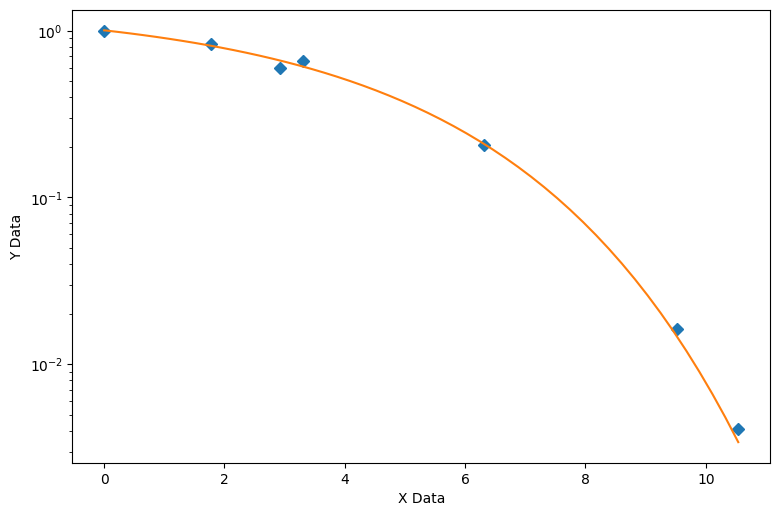

In [109]:
# x=[0,1.778,2.921,3.302,6.317,9.524,10.54]
# y=[1,0.831763771,0.598411595,0.656145266,0.207014135,0.016218101,0.004102041]

# zv = np.array(x, dtype=float)
# uz = np.array(y, dtype=float)


def func(x, a, b, c): # Sigmoidal Gompertz C from zunzun.com
    return a * np.exp(b * np.exp(c*x))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = func(zv, *parameterTuple)
    return np.sum((uz - val) ** 2.0)


def generate_Initial_Parameters():
    parameterBounds = []
    parameterBounds.append([-2.0, 2.0]) # search bounds for a
    parameterBounds.append([-2.0, 2.0]) # search bounds for b
    parameterBounds.append([-2.0, 2.0]) # search bounds for c

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=3)
    return result.x

# by default, differential_evolution completes by calling curve_fit() using parameter bounds
geneticParameters = generate_Initial_Parameters()

# now call curve_fit without passing bounds from the genetic algorithm,
# just in case the best fit parameters are aoutside those bounds
fittedParameters, pcov = curve_fit(func, zv, uz, geneticParameters)
print('Fitted parameters:', fittedParameters)
print()

modelPredictions = func(zv, *fittedParameters) 

absError = modelPredictions - uz

SE = np.square(absError) # squared errors
MSE = np.mean(SE) # mean squared errors
RMSE = np.sqrt(MSE) # Root Mean Squared Error, RMSE
Rsquared = 1.0 - (np.var(absError) / np.var(uz))

print()
print('RMSE:', RMSE)
print('R-squared:', Rsquared)

print()


##########################################################
# graphics output section
def ModelAndScatterPlot(graphWidth, graphHeight):
    f = plt.figure(figsize=(graphWidth/100.0, graphHeight/100.0), dpi=100)
    axes = f.add_subplot(111)

    # plot wuth log Y axis scaling
    plt.yscale('log')

    # first the raw data as a scatter plot
    axes.plot(zv, uz,  'D')

    # create data for the fitted equation plot
    xModel = np.linspace(min(zv), max(zv))
    yModel = func(xModel, *fittedParameters)

    # now the model as a line plot
    axes.plot(xModel, yModel)

    axes.set_xlabel('X Data') # X axis data label
    axes.set_ylabel('Y Data') # Y axis data label

    plt.show()
    plt.close('all') # clean up after using pyplot

graphWidth = 900
graphHeight = 600
ModelAndScatterPlot(graphWidth, graphHeight)

In [124]:
# start_time = time.time()
# print("Total calculation time: %s seconds " % (time.time() - start_time))

therm_const = 5
r0 = rad

# Chenais 2.1.4
def fit_analytic(r_var):
    y = therm_const/r0*(r0**2 - r_var**2)
    return y

In [125]:
print(fit_analytic(1.))

-2.916666666666667


In [126]:
fit_an_vals = []

data_len = len(xv)   
# nvals = np.linspace(1.5, 4, num=data_len)
nvals = np.linspace(-4, 1.5, num=data_len)


for n in nvals:
    fit_an = fit_analytic(n)
    fit_an_vals.append(fit_an)
    # print('n: %s' %n)
    # print('fit_an: %s' %fit_an)

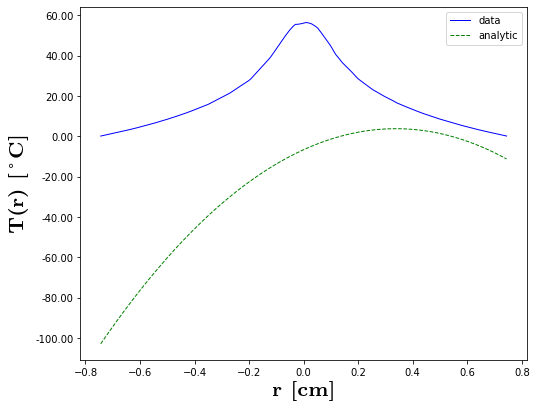

In [127]:
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv, ux,'b-', label='data'.format(idx*dt), linewidth = 1)
# ax.plot(xv, fit_y, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)

ax.plot(xv, fit_an_vals,'g--', label='analytic'.format(idx*dt), linewidth = 1)

#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
# print('Gaussian fit parameters:')
# print('A: %.2f, B: %.2f' %(parameters[0], parameters[1]))

In [93]:

def objective(x, a, b, c):
    return a * x + b * x**2 + c
 
# load the dataset
# url = 'https://raw.githubusercontent.com/jbrownlee/Datasets/master/longley.csv'
# dataframe = read_csv(url, header=None)
# data = dataframe.values

# choose the input and output variables
# x_long, y_long = data[:, 4], data[:, -1]

# curve fit
popt, _ = curve_fit(objective, zv, uz)

# summarize the parameter values
a, b, c = popt
print('y = %.5f * x + %.5f * x^2 + %.5f' % (a, b, c))

y = -1.61700 * x + 0.63753 * x^2 + 63.67330


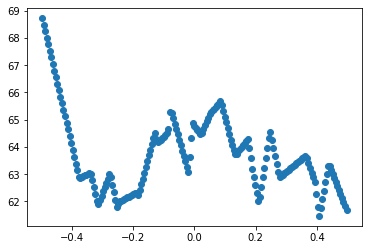

In [94]:
# plot input vs output
plt.scatter(zv, uz)

# define a sequence of inputs between the smallest and largest known inputs
x_line = np.arange(min(zv), max(zv), 1)

# calculate the output for the range
y_line = objective(x_line, a, b, c)

# create a line plot for the mapping function
plt.plot(x_line, y_line, '--', color='red')

plt.show()

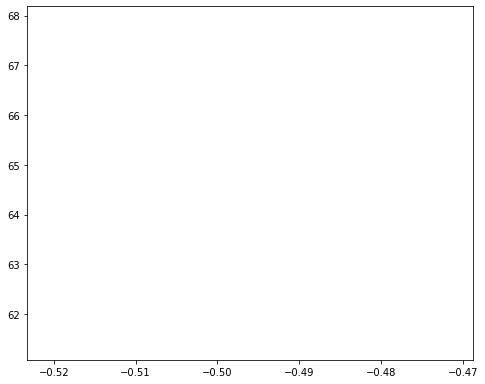

In [92]:
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(x_line, y_line,'g-', label='analytic')
# ax.plot(xv, ux,'b-', label='data'.format(idx*dt), linewidth = 1)
# ax.plot(xv, fit_y, 'r--', label='fit')
# ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
# ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)



#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
# plt.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()
# print('Gaussian fit parameters:')
# print('A: %.2f, B: %.2f' %(parameters[0], parameters[1]))

In [75]:
# longitudinal fit function 1
def long_fit(x, A, B):
    y = A*np.exp(-1*B*x**2)
    return y
parameters_long, covariance_long = curve_fit(long_fit, xv, ux)

# Gaussian fit function 2
# x0 = rad
# sigma = .2
# def Gauss(x, H, A, x0, sigma):
#     return H + A * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))
# parameters, covariance = curve_fit(Gauss, xv, ux, rad, rad)
  
fit_a = parameters_long[0]
fit_b = parameters_long[1]
  
fit_y_long = long_fit(zv, fit_a, fit_b)

fit parameters:
a: 56.93, b: 8.33


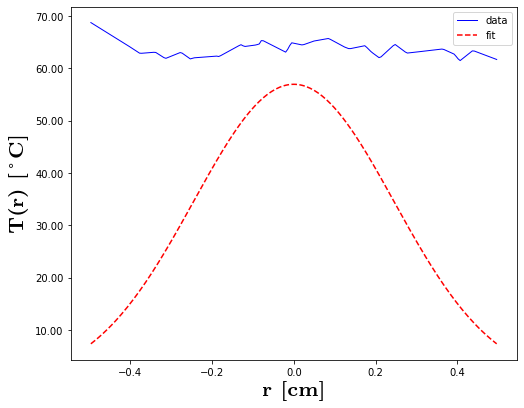

In [74]:
# plot transverse temperature profile at final time step
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(zv, uz,'b-', label='data'.format(idx*dt), linewidth = 1)
ax.plot(zv, fit_y_long, 'r--', label='fit')
ax.set_xlabel(r'r [cm]', x=0.5, **hfontMed)
ax.set_ylabel(r'T(r) [$^\circ$C]', y=0.5, **hfontMed)

#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
plt.legend()
fig.show()
print('fit parameters:')
print('a: %.2f, b: %.2f' %(parameters_long[0], parameters_long[1]))

In [36]:
n01 = len(xv)                         
mean = sum(xv*ux)/n01                   
sigma = sum(ux*(xv-mean)**2)/n01        
def fit_func(x,a,x0,sigma):
    return a*exp(-(x-x0)**2/(2*sigma**2))

print('mean: %s, sigma: %s' %(mean, sigma))

mean: 0.011544417383034519, sigma: 1.6702719987993324


In [35]:
popt,pcov = curve_fit(fit_func,xv,ux,p0=[1,mean,sigma])


UFLValueError: Invalid type conversion: [-1.02309416e-01 -1.00304413e-01 -9.83192519e-02 -9.63539319e-02
 -9.44084533e-02 -9.24828161e-02 -9.05770202e-02 -8.86910657e-02
 -8.68249525e-02 -8.49786807e-02 -8.31522502e-02 -8.13456612e-02
 -7.95589134e-02 -7.77920071e-02 -7.60449421e-02 -7.43177184e-02
 -7.26103362e-02 -7.09227953e-02 -6.92550957e-02 -6.76072375e-02
 -6.59792207e-02 -6.43710452e-02 -6.27827111e-02 -6.12142184e-02
 -5.96655670e-02 -5.81367570e-02 -5.66277883e-02 -5.51386610e-02
 -5.36693751e-02 -5.22199305e-02 -5.07903273e-02 -4.93805654e-02
 -4.79906450e-02 -4.66205658e-02 -4.52703281e-02 -4.39399317e-02
 -4.26293766e-02 -4.13386629e-02 -4.00677906e-02 -3.88167597e-02
 -3.75855701e-02 -3.63742218e-02 -3.51827149e-02 -3.40110494e-02
 -3.28592253e-02 -3.17272425e-02 -3.06151011e-02 -2.95228010e-02
 -2.84503423e-02 -2.73977250e-02 -2.63649490e-02 -2.53520143e-02
 -2.43589211e-02 -2.33856692e-02 -2.24322587e-02 -2.14986895e-02
 -2.05849617e-02 -1.96910752e-02 -1.88170301e-02 -1.79628264e-02
 -1.71284640e-02 -1.63139430e-02 -1.55192634e-02 -1.47444251e-02
 -1.39894282e-02 -1.32542726e-02 -1.25389584e-02 -1.18434856e-02
 -1.11678541e-02 -1.05120640e-02 -9.87611524e-03 -9.26000785e-03
 -8.66374182e-03 -8.08731716e-03 -7.53073385e-03 -6.99399191e-03
 -6.47709132e-03 -5.98003210e-03 -5.50281424e-03 -5.04543774e-03
 -4.60790261e-03 -4.19020883e-03 -3.79235642e-03 -3.41434537e-03
 -3.05617568e-03 -2.71784735e-03 -2.39936038e-03 -2.10071477e-03
 -1.82191053e-03 -1.56294765e-03 -1.32382612e-03 -1.10454596e-03
 -9.05107166e-04 -7.25509729e-04 -5.65753653e-04 -4.25838939e-04
 -3.05765587e-04 -2.05533596e-04 -1.25142966e-04 -6.45936983e-05
 -2.38857919e-05 -3.01924698e-06 -1.99406361e-06 -2.08102418e-05
 -5.94677814e-05 -1.17966683e-04 -1.96306945e-04 -2.94488569e-04
 -4.12511555e-04 -5.50375902e-04 -7.08081611e-04 -8.85628681e-04
 -1.08301711e-03 -1.30024691e-03 -1.53731806e-03 -1.79423058e-03
 -2.07098446e-03 -2.36757969e-03 -2.68401630e-03 -3.02029426e-03
 -3.37641358e-03 -3.75237427e-03 -4.14817631e-03 -4.56381972e-03
 -4.99930449e-03 -5.45463062e-03 -5.92979812e-03 -6.42480697e-03
 -6.93965719e-03 -7.47434877e-03 -8.02888170e-03 -8.60325601e-03
 -9.19747167e-03 -9.81152869e-03 -1.04454271e-02 -1.10991668e-02
 -1.17727479e-02 -1.24661704e-02 -1.31794342e-02 -1.39125394e-02
 -1.46654860e-02 -1.54382739e-02 -1.62309032e-02 -1.70433738e-02
 -1.78756858e-02 -1.87278392e-02 -1.95998339e-02 -2.04916700e-02
 -2.14033474e-02 -2.23348662e-02 -2.32862264e-02 -2.42574279e-02
 -2.52484708e-02 -2.62593551e-02 -2.72900807e-02 -2.83406477e-02
 -2.94110560e-02 -3.05013057e-02 -3.16113968e-02 -3.27413292e-02
 -3.38911030e-02 -3.50607181e-02 -3.62501746e-02 -3.74594725e-02
 -3.86886117e-02 -3.99375923e-02 -4.12064143e-02 -4.24950776e-02
 -4.38035823e-02 -4.51319283e-02 -4.64801157e-02 -4.78481445e-02
 -4.92360146e-02 -5.06437261e-02 -5.20712789e-02 -5.35186731e-02
 -5.49859087e-02 -5.64729856e-02 -5.79799039e-02 -5.95066636e-02
 -6.10532646e-02 -6.26197070e-02 -6.42059907e-02 -6.58121158e-02
 -6.74380823e-02 -6.90838901e-02 -7.07495393e-02 -7.24350298e-02
 -7.41403617e-02 -7.58655350e-02 -7.76105496e-02 -7.93754056e-02
 -8.11601030e-02 -8.29646417e-02 -8.47890218e-02 -8.66332432e-02
 -8.84973060e-02 -9.03812102e-02 -9.22849557e-02 -9.42085426e-02
 -9.61519708e-02] can not be converted to any UFL type.

In [ ]:

plt.plot(x,y,'b+:',label='data')
plt.plot(x,gaus(x,*popt),'ro:',label='fit')
plt.legend()
plt.title('Fig. 3 - Fit for Time Constant')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.show()

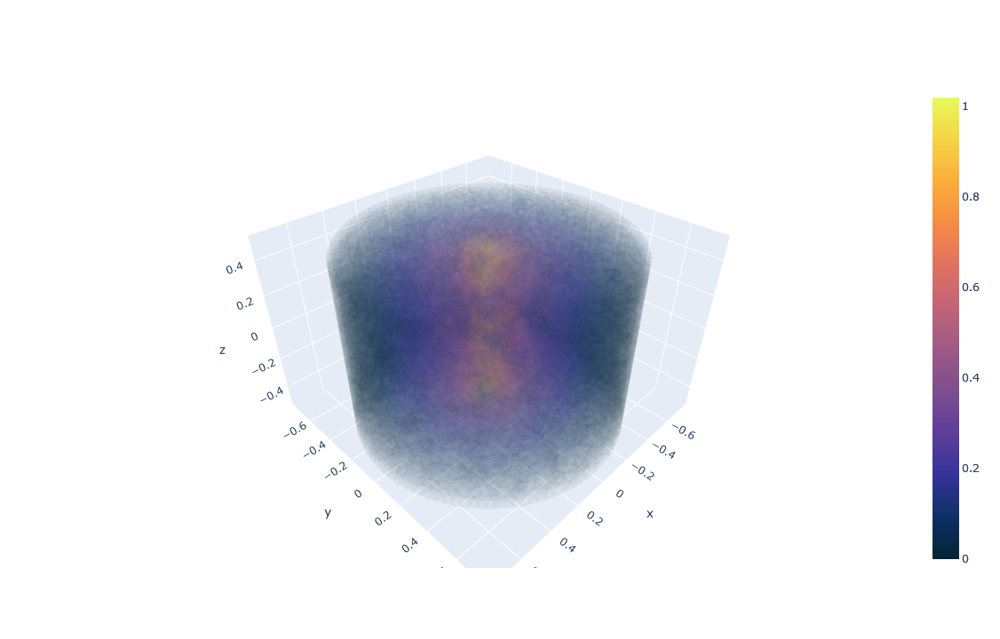

In [10]:
uvals = u.compute_vertex_values()

fig = plotly.graph_objects.Figure(
    data=[plotly.graph_objects.Mesh3d(
        x=xvals, y=yvals, z=zvals,
        i=ii, j=jj, k=kk,
        colorscale='thermal',
        intensity=uvals,
        alphahull=-1,
        opacity=0.020
    )]
)
fig.update_layout(scene_aspectmode='data')
fig.show()

In [10]:
uvals

array([0.00000000e+00, 5.62505111e-06, 7.83255459e-06, ...,
       6.03745129e-05, 7.72048733e-06, 0.00000000e+00])

In [13]:
# compute error in L2 norm
error_L2 = errornorm(u_n, u, 'L2')

*** Warning: Degree of exact solution may be inadequate for accurate result in errornorm.


In [14]:
# compute maximum error at vertices
vertex_values_u_n = u_n.compute_vertex_values(mesh)
vertex_values_u = u.compute_vertex_values(mesh)

error_max = np.max(np.abs(vertex_values_u_n - vertex_values_u))

In [15]:
# print errors
print('error_L2  = %e' %error_L2)
print('error_max = %e' %error_max)

error_L2  = 0.000000e+00
error_max = 0.000000e+00


In [ ]:
vertex_values_u_n

In [ ]:
# save solution to file in VTK format
vtkfile = File('cylinder_soln01.pvd')
vtkfile << u

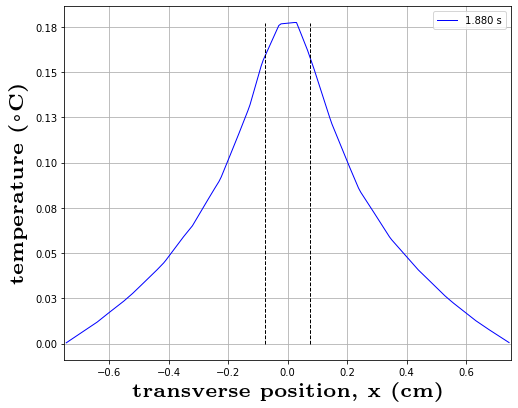

In [78]:

lwvals_negx = -wdT, -wdT
lwvals_posx = wdT, wdT

lwvals_ydegc = 0, np.max(ux)

fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv, ux,'b-', label='{0:5.3f} s'.format(idx*dt), linewidth = 1)
ax.plot(lwvals_negx, lwvals_ydegc,'k--', linewidth = 1)
ax.plot(lwvals_posx, lwvals_ydegc,'k--', linewidth = 1)
ax.set_xlim(-0.75, 0.75)
#ax.set_ylim(0, 0.18)
ax.set_xlabel(r'transverse position, x (cm)', **hfontMed)
ax.set_ylabel(r'temperature ($\circ$C)', **hfontMed)
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(tvals_10ms)
plt.grid(True)
ax.legend()

In [ ]:
# save solution to file in VTK format
vtkfile = File('poisson/solution.pvd')
vtkfile << u

In [ ]:
plot(mesh)

In [ ]:
# save results for export to ParaView
vtkfile = File('cylinder.pvd')